In [49]:
import numpy as np
import os
from PIL import Image
dir_data  = "/content/Paintings"
# setting image shape to 32x32
img_shape = (32, 32, 3)

nm_imgs   =  np.sort(os.listdir(dir_data))

In [50]:
X_train = []
for file in nm_imgs:
    try:
        img = Image.open(dir_data+'/'+file)
        img = img.convert('RGB')
        img = img.resize((32,32))
        img = np.asarray(img)/255
        X_train.append(img)
    except:
        print("something went wrong")

X_train = np.array(X_train)
X_train.shape

(162, 32, 32, 3)

In [51]:
from numpy import asarray
from numpy import savez_compressed

# save to npy file
savez_compressed('kaggle_images_32x32.npz', X_train)

In [52]:
import matplotlib.pyplot as plt
import numpy as np
import torch

import torch.nn as nn

from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from torch.nn import Module, Sequential, Conv2d, ConvTranspose2d, LeakyReLU, BatchNorm2d, ReLU, Tanh, Sigmoid, BCELoss




In [53]:

dev = 'cuda:0' if torch.cuda.is_available() == True else 'cpu'
device = torch.device(dev)

In [54]:

def plot_images(imgs, grid_size = 5):
    """
    imgs: vector containing all the numpy images
    grid_size: 2x2 or 5x5 grid containing images
    """

    fig = plt.figure(figsize = (8, 8))
    columns = rows = grid_size
    plt.title("Generated images")

    for i in range(1, columns*rows +1):
        plt.axis("off")
        fig.add_subplot(rows, columns, i)
        plt.imshow(imgs[i])
    plt.show()


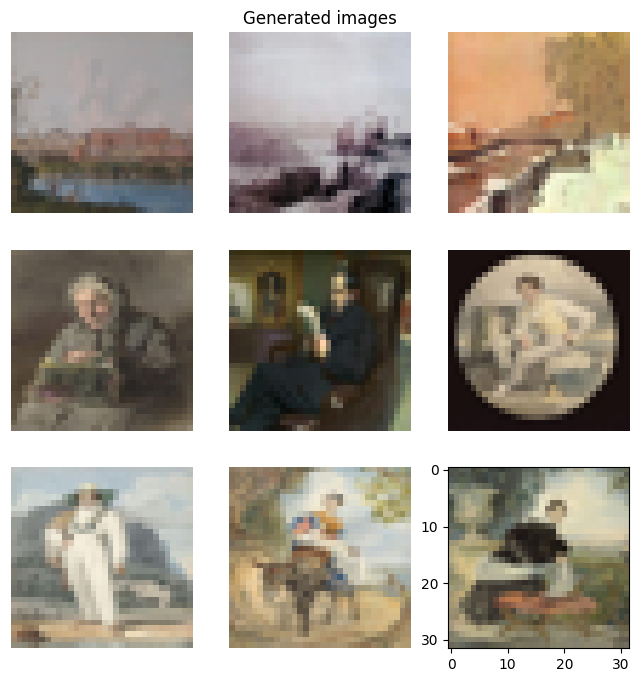

In [55]:
# load the numpy vector containing image representations
imgs = np.load('kaggle_images_32x32.npz')

plot_images(imgs['arr_0'], 3)

In [60]:
class painting(Dataset):
    """painting Dataset."""

    def __init__(self, npz_imgs):

        self.imgs = npz_imgs

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        image = self.imgs[idx]

        return image

In [62]:
dataloader = DataLoader(dataset = dset, batch_size = batch_size, shuffle = shuffle)


In [61]:
#Preparing dataloader for training

transpose_imgs = np.transpose( # imp step to convert image size from (7312, 32,32,3) to (7312, 3,32,32)
    np.float32(imgs['arr_0']), # imp step to convert double -> float (by default numpy input uses double as data type)
    (0, 3,1,2) # tuple to describe how to rearrange the dimensions
    )

dset = painting(transpose_imgs) # passing the npz variable to the constructor class
batch_size = 32
shuffle = True

dataloader = DataLoader(dataset = dset, batch_size = batch_size, shuffle = shuffle)

In [63]:
class Generator(Module):
    def __init__(self):

        # calling constructor of parent class
        super().__init__()

        self.gen = Sequential(
          ConvTranspose2d(in_channels = 100, out_channels = 512 , kernel_size = 4, stride = 1, padding = 0, bias = False),
          # the output from the above will be b_size ,512, 4,4
          BatchNorm2d(num_features = 512), # From an input of size (b_size, C, H, W), pick num_features = C
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 512, out_channels = 256 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          # the output from the above will be b_size ,256, 8,8
          BatchNorm2d(num_features = 256),
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 256, out_channels = 128 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          # the output from the above will be b_size ,128, 16,16
          BatchNorm2d(num_features = 128),
          ReLU(inplace = True),

          ConvTranspose2d(in_channels = 128, out_channels = 3 , kernel_size = 4, stride = 2, padding = 1, bias = False),
          # the output from the above will be b_size ,3, 32,32
          Tanh()

        )

    def forward(self, input):
        return self.gen(input)

In [64]:
ConvTranspose2d(in_channels = 100, out_channels = 512, kernel_size = 4, stride = 1, padding = 0, bias = False),
# the output from the above will be b_size ,512, 4,4

(ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False),)

In [65]:
class ExampleGenerator(Module):

      def __init__(self):
          # calling constructor of parent class
          super().__init__()
          self.gen = Sequential(
              ConvTranspose2d(
              in_channels = 100,
              out_channels = 512 ,
              kernel_size = 4,
              stride = 1,
              padding = 0,
              bias = False)
              )

      def forward(self, input):
           return self.gen(input)

# defining class object
ex_gen = ExampleGenerator()

# defining random input for the model: b_size = 2 here
t = torch.randn(2, 100, 1, 1)


In [66]:
#Defining the Discriminator class
class Discriminator(Module):
    def __init__(self):

        super().__init__()
        self.dis = Sequential(

            # input is (3, 32, 32)
            Conv2d(in_channels = 3, out_channels = 32, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32, 16, 16
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 32, out_channels = 32*2, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32*2, 8, 8
            BatchNorm2d(32 * 2),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 32*2, out_channels = 32*4, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 32*4, 4, 4
            BatchNorm2d(32 * 4),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 32*4, out_channels = 32*8, kernel_size = 4, stride = 2, padding = 1, bias=False),
            # ouput from above layer is b_size, 256, 2, 2
            # NOTE: spatial size of this layer is 2x2, hence in the final layer, the kernel size must be 2 instead (or smaller than) 4
            BatchNorm2d(32 * 8),
            LeakyReLU(0.2, inplace=True),

            Conv2d(in_channels = 32*8, out_channels = 1, kernel_size = 2, stride = 2, padding = 0, bias=False),
            # ouput from above layer is b_size, 1, 1, 1
            Sigmoid()
        )

    def forward(self, input):
        return self.dis(input)


In [67]:
# creating gen and disc
netG = Generator().to(device)
netD = Discriminator().to(device)

In [68]:
def init_weights(m):
    if type(m) == ConvTranspose2d:
        nn.init.normal_(m.weight, 0.0, 0.02)
    elif type(m) == BatchNorm2d:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)

In [69]:
# initializing the weights
netD.apply(init_weights)
netG.apply(init_weights)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)

In [70]:
# Setting up otimizers for both Generator and Discriminator

opt_D = optim.Adam(netD.parameters(), lr = 0.0002, betas= (0.5, 0.999))
opt_G = optim.Adam(netG.parameters(), lr = 0.0002, betas= (0.5, 0.999))

In [71]:
# Setting up the loss function - BCELoss (to check how far the predicted value is from real value)

loss = BCELoss()

In [72]:
import torch
import torchvision.transforms as transforms
from torchvision.models import inception_v3
from scipy.stats import entropy
import numpy as np

# Load pre-trained InceptionV3 model
inception_model = inception_v3(pretrained=True, transform_input=False, aux_logits=True)
inception_model.eval()

# Function to preprocess images
def preprocess_images(images):
    transform = transforms.Compose([
        transforms.Resize((299, 299)),  # Resize images to InceptionV3 input size
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # Normalize images
    ])
    return torch.stack([transform(img) for img in images])

# Function to calculate IS
def calculate_is(images, batch_size=32):
    images = preprocess_images(images)
    preds_list = []
    with torch.no_grad():
        for i in range(0, len(images), batch_size):
            batch = images[i:i+batch_size]
            preds = inception_model(batch)
            preds_list.append(torch.softmax(preds, dim=1).cpu().numpy())

    preds = np.concatenate(preds_list, axis=0)
    probs = np.exp(preds) / np.sum(np.exp(preds), axis=1, keepdims=True)

    marginal_entropy = entropy(np.mean(probs, axis=0))
    mean_entropy = np.mean(marginal_entropy)

    inception_score = np.exp(mean_entropy)

    return inception_score

# Replace 'generated_images' with your generated images array (shape: (num_images, height, width, channels))
# Ensure the images are preprocessed and in the correct format for InceptionV3 (299x299, [-1, 1] or [0, 1])
#generated_images = preprocess_images(generated_images)  # Preprocess your generated images

# Calculate Inception Score
#is_score = calculate_is(generated_images)
#print("Inception Score:", is_score)


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<ipython-input-73-36e332c9e893>:51: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  numpyint = np.int(loss_disc.item() * 1000)
<ipython-input-73-36e332c9e893>:68: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1

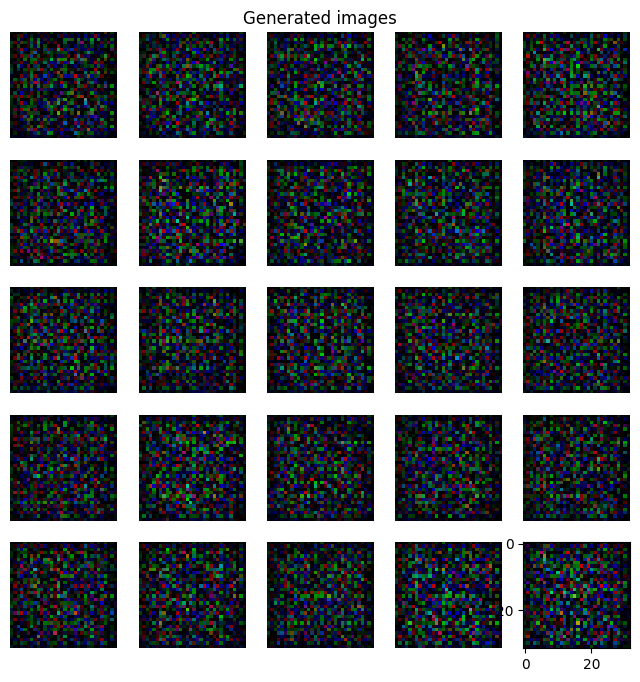

********************
 Epoch 0 and iteration 0 


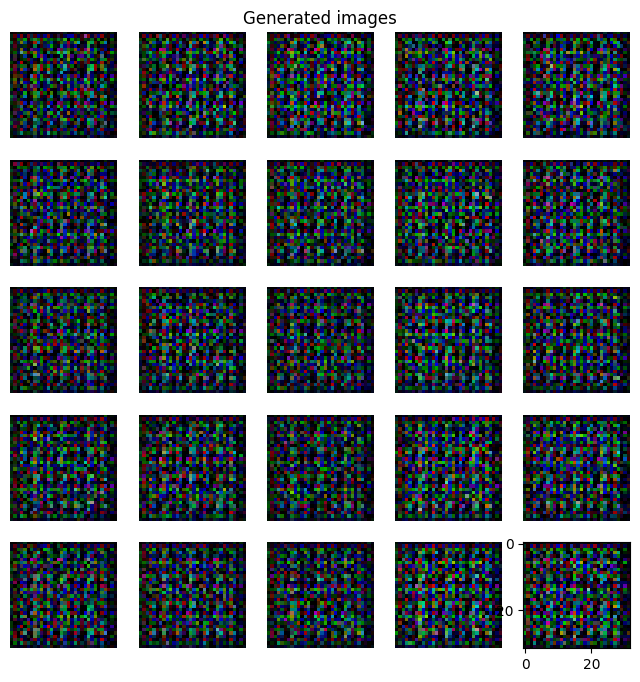

********************
 Epoch 1 and iteration 0 


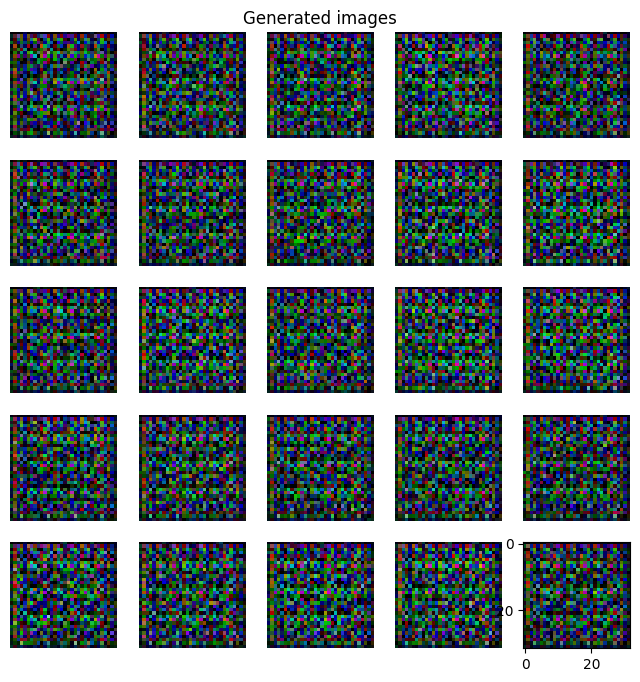

********************
 Epoch 2 and iteration 0 


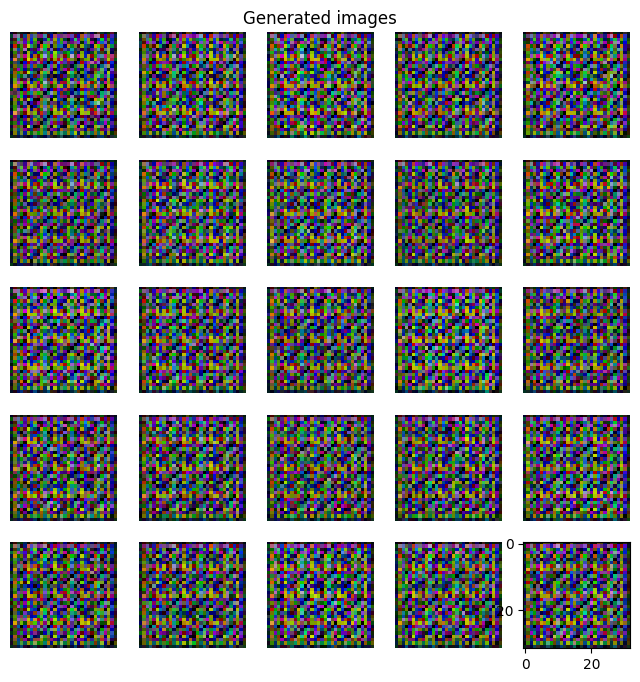

********************
 Epoch 3 and iteration 0 


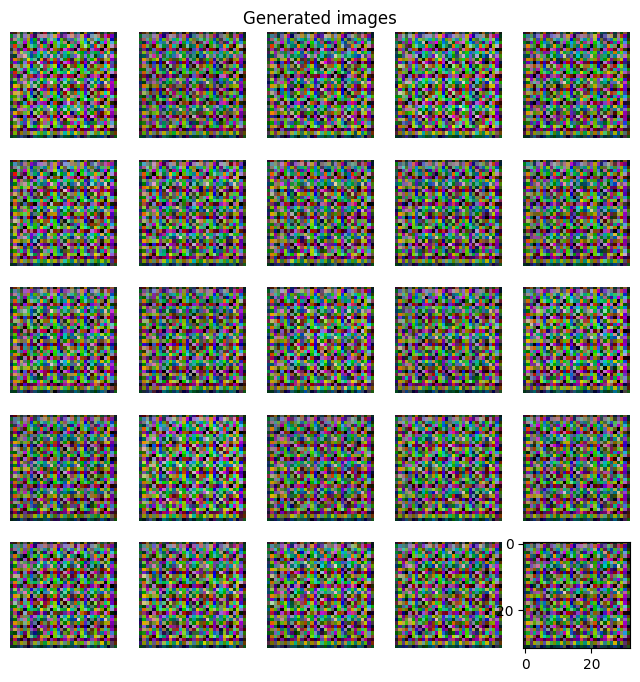

********************
 Epoch 4 and iteration 0 


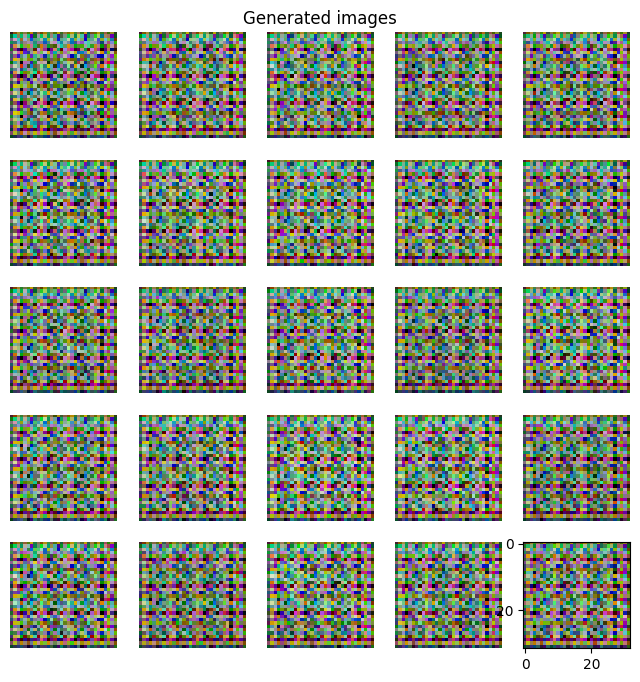

********************
 Epoch 5 and iteration 0 


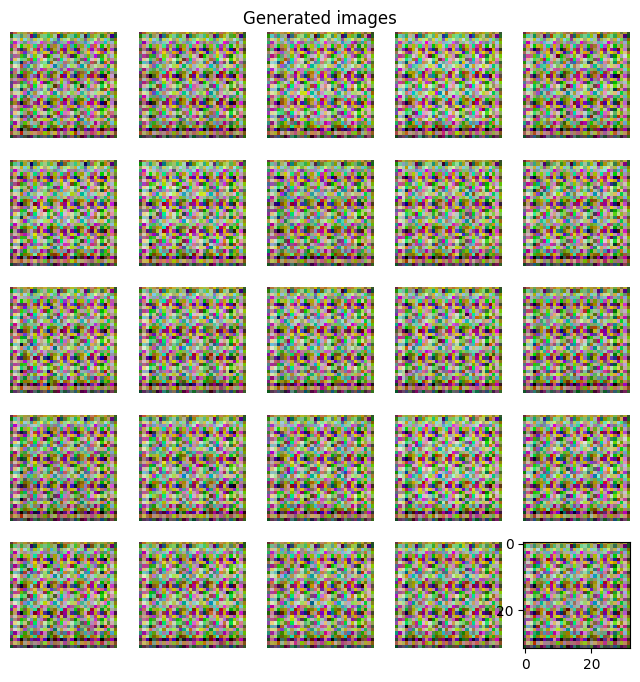

********************
 Epoch 6 and iteration 0 


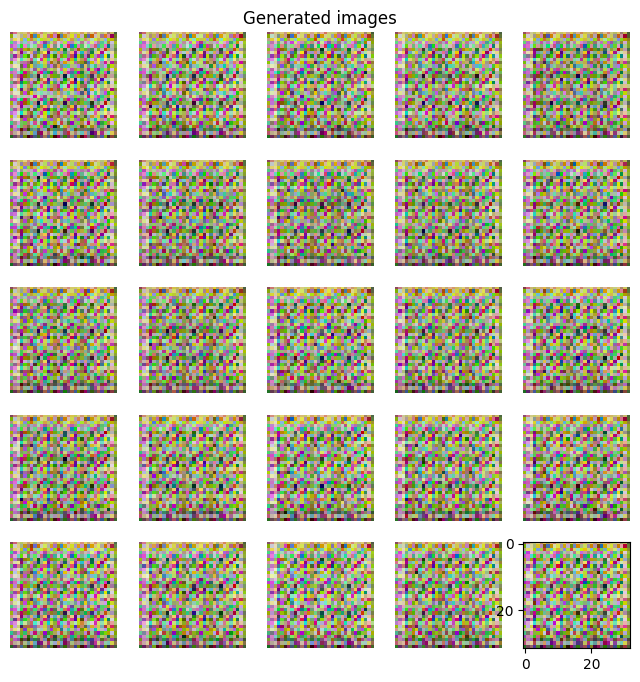

********************
 Epoch 7 and iteration 0 


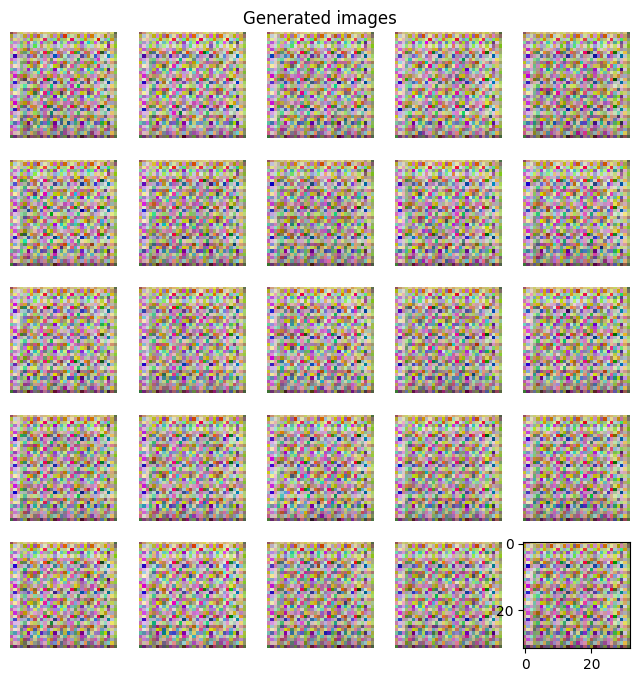

********************
 Epoch 8 and iteration 0 


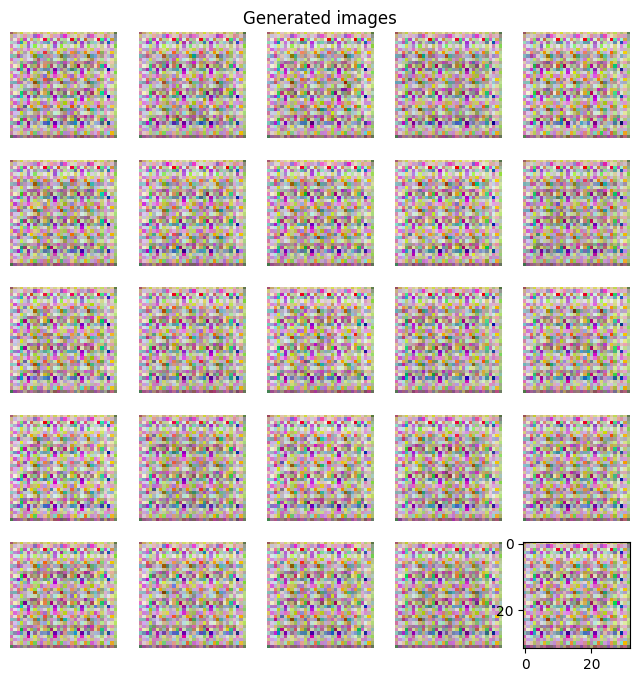

********************
 Epoch 9 and iteration 0 


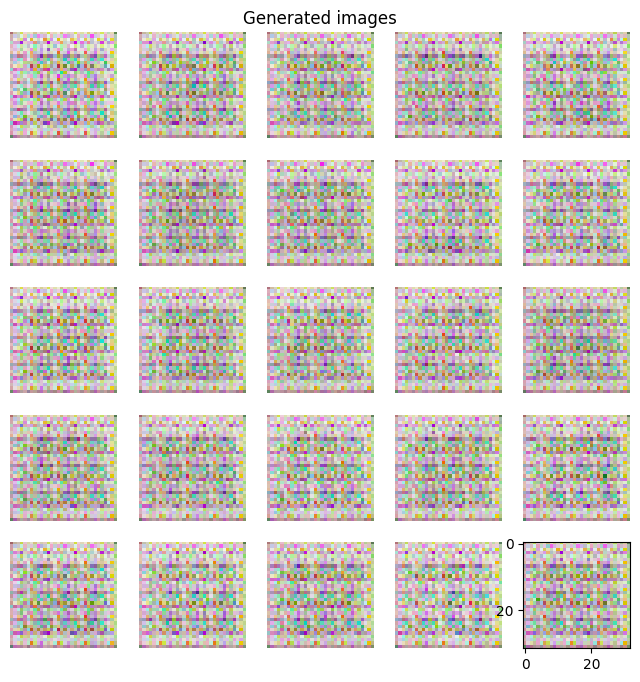

********************
 Epoch 10 and iteration 0 


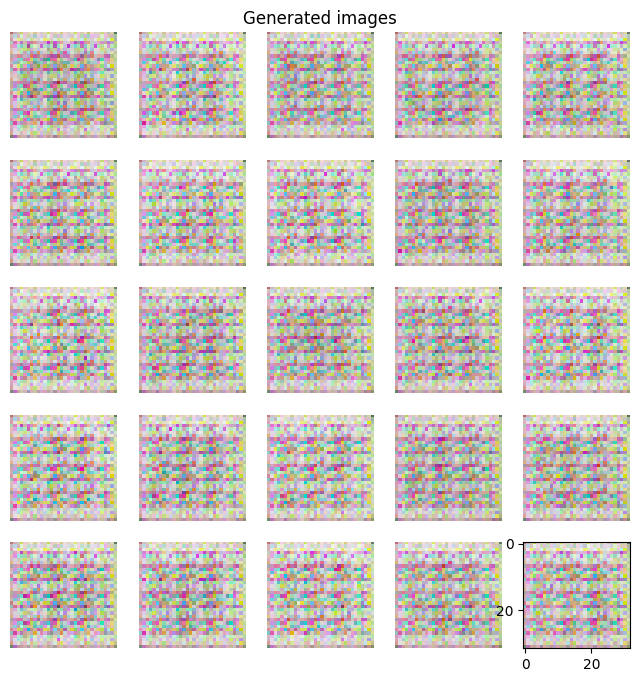

********************
 Epoch 11 and iteration 0 


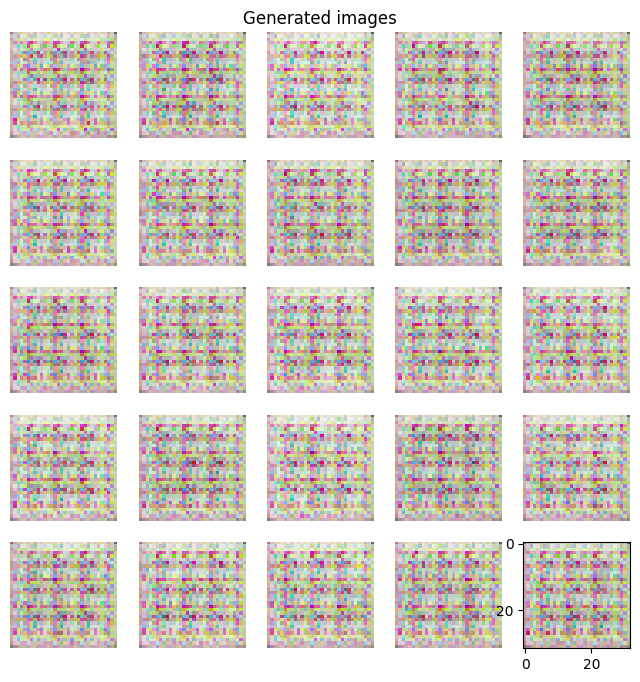

********************
 Epoch 12 and iteration 0 


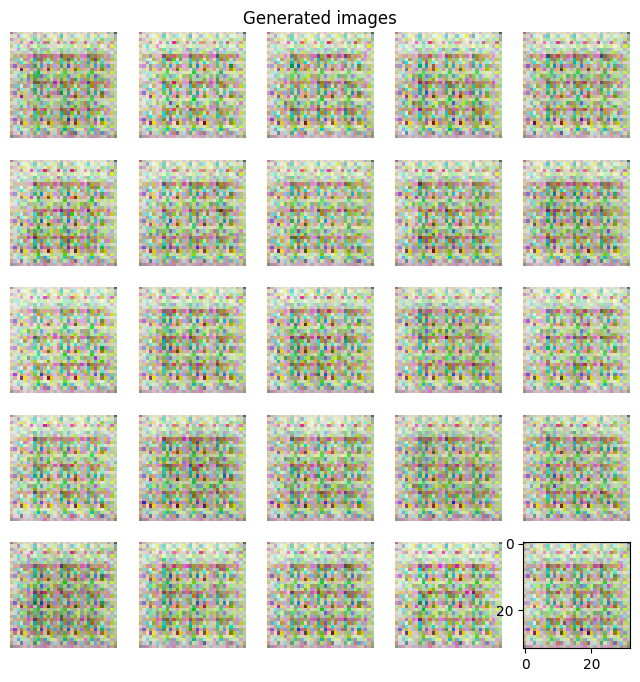

********************
 Epoch 13 and iteration 0 


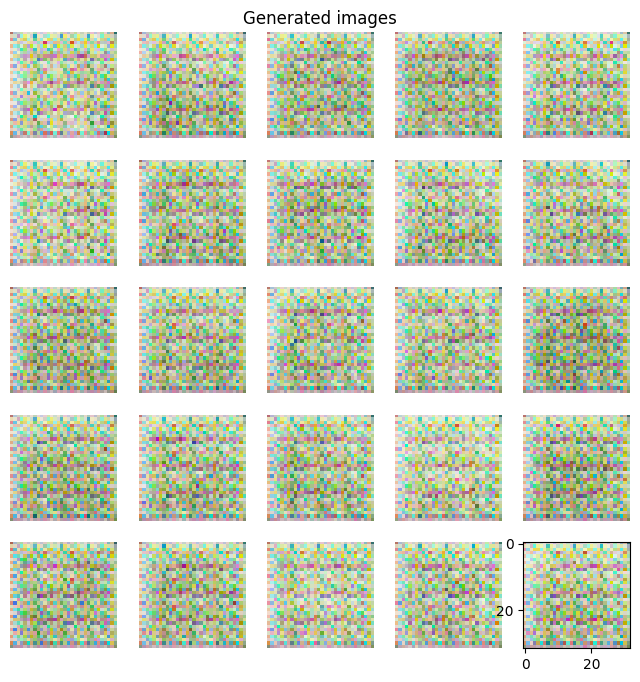

********************
 Epoch 14 and iteration 0 


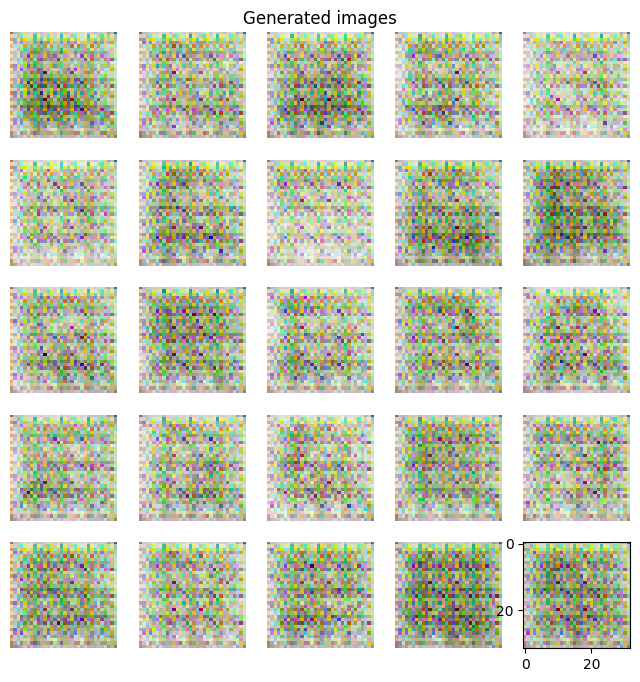

********************
 Epoch 15 and iteration 0 


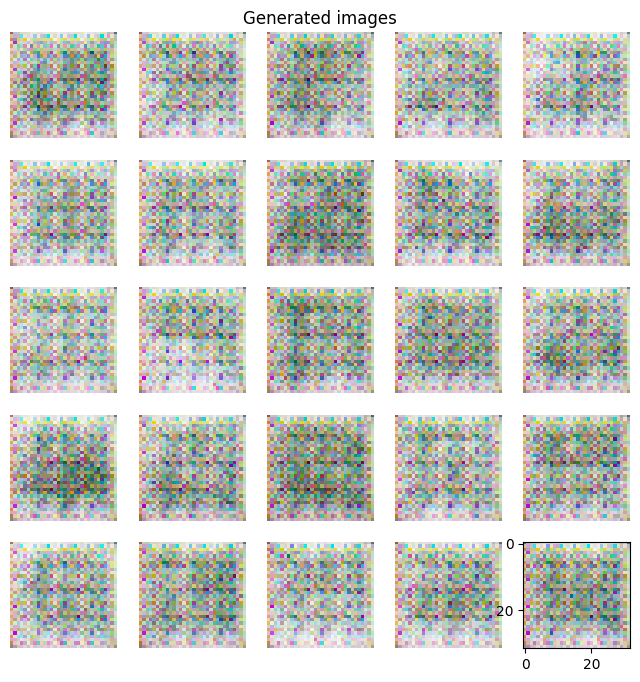

********************
 Epoch 16 and iteration 0 


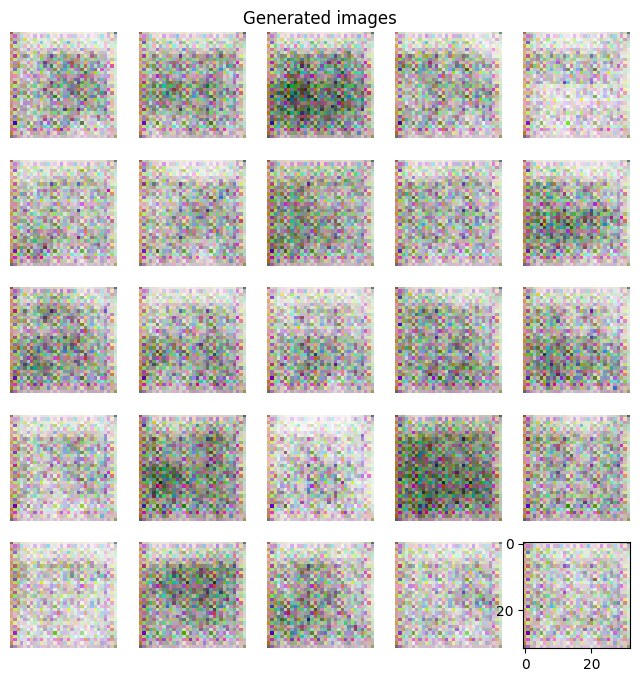

********************
 Epoch 17 and iteration 0 


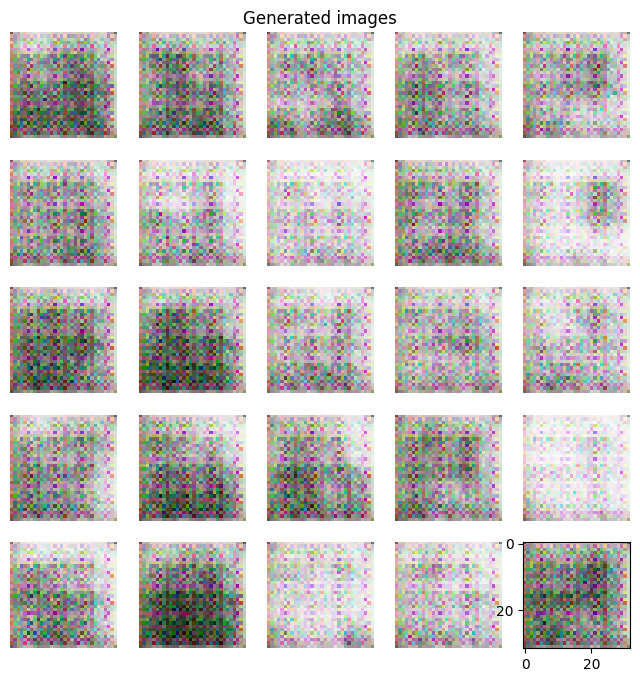

********************
 Epoch 18 and iteration 0 


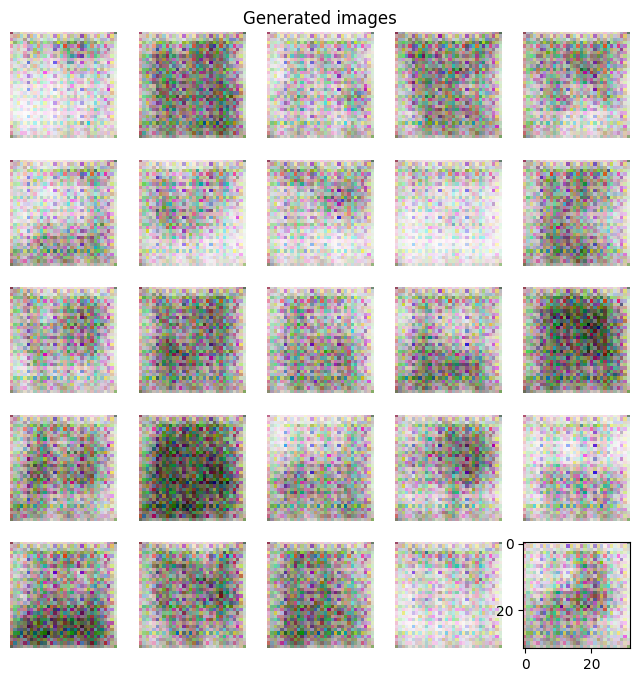

********************
 Epoch 19 and iteration 0 


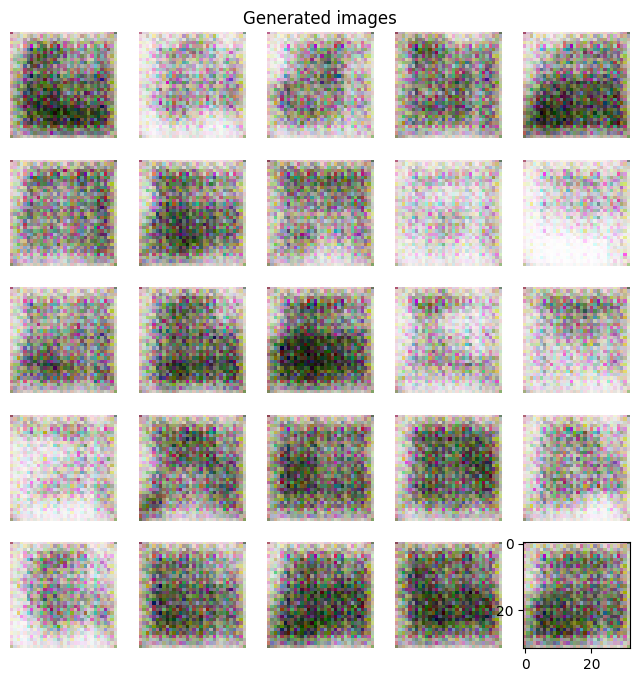

********************
 Epoch 20 and iteration 0 


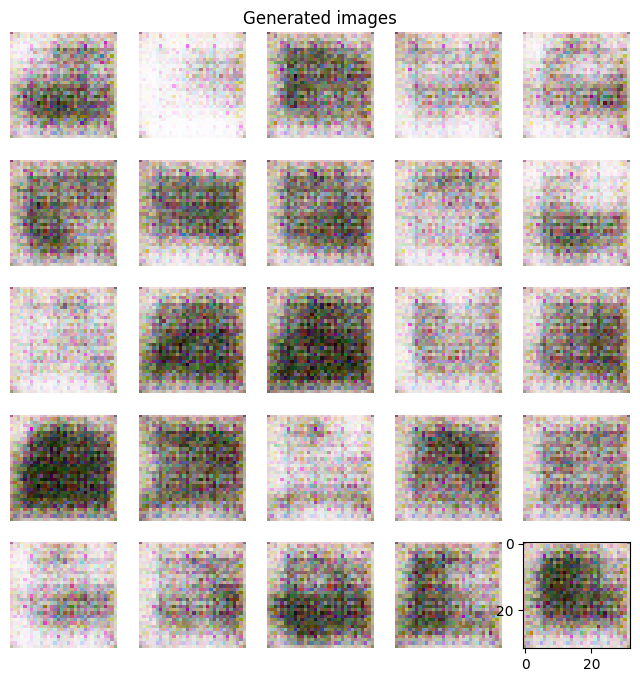

********************
 Epoch 21 and iteration 0 


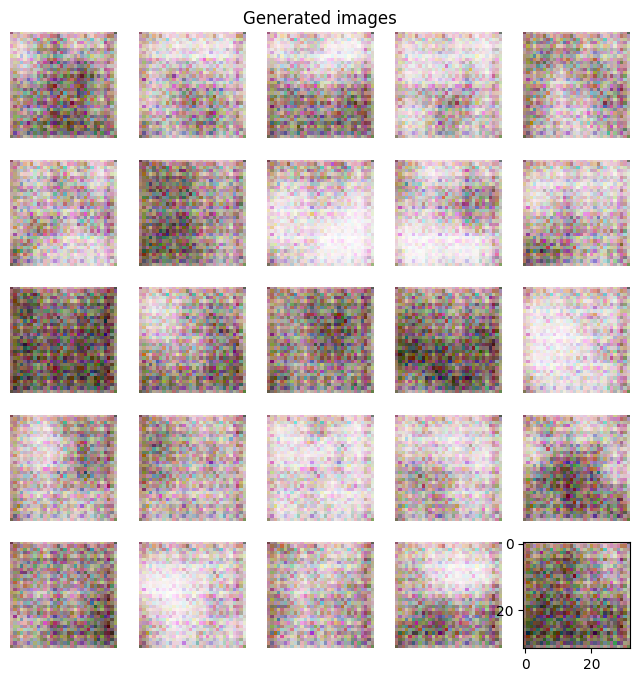

********************
 Epoch 22 and iteration 0 


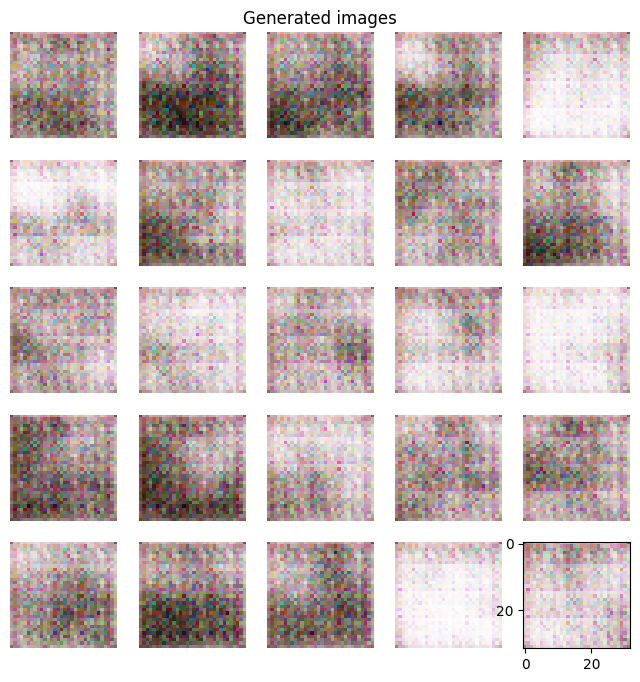

********************
 Epoch 23 and iteration 0 


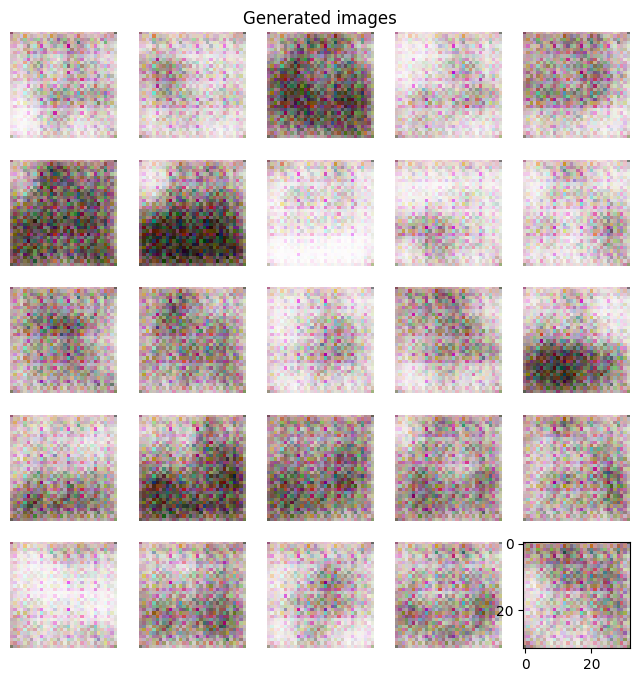

********************
 Epoch 24 and iteration 0 


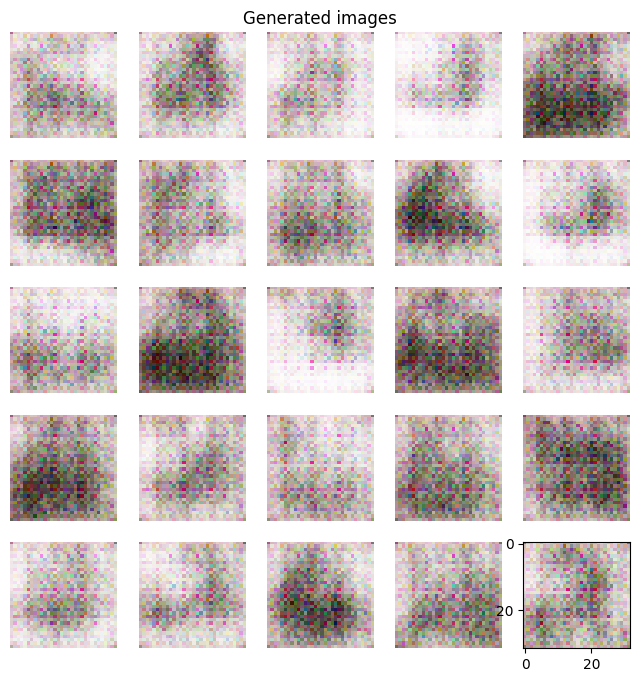

********************
 Epoch 25 and iteration 0 


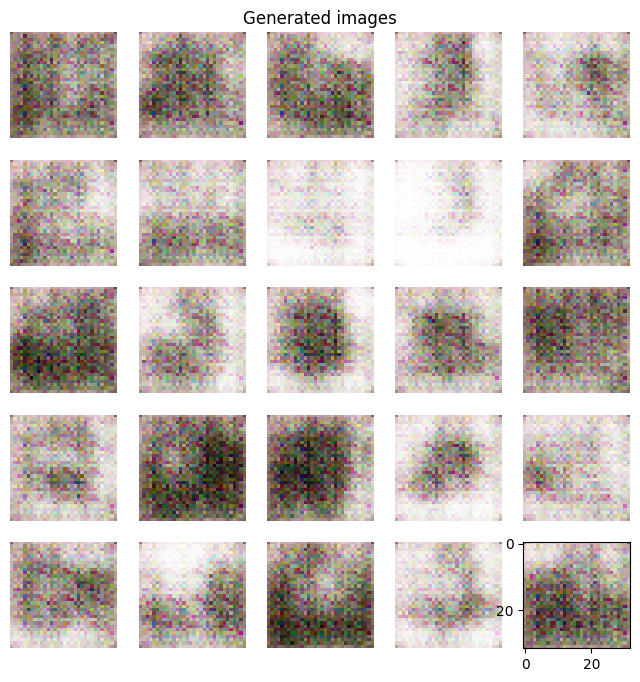

********************
 Epoch 26 and iteration 0 


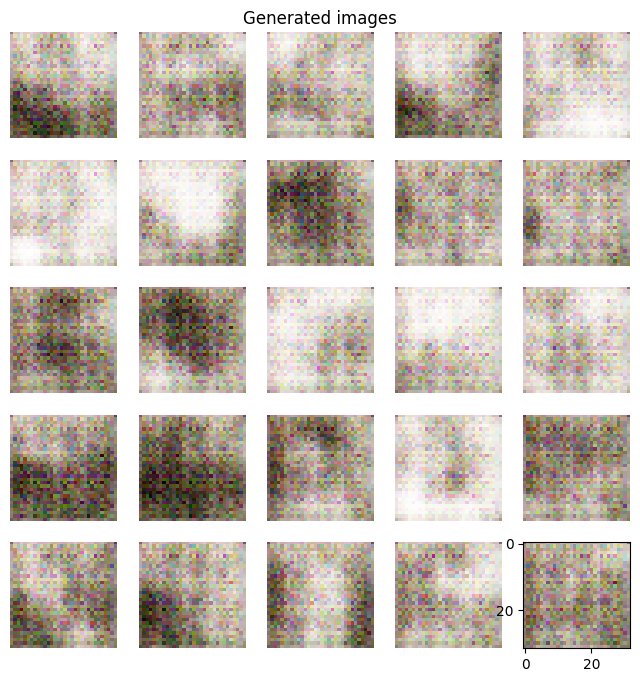

********************
 Epoch 27 and iteration 0 


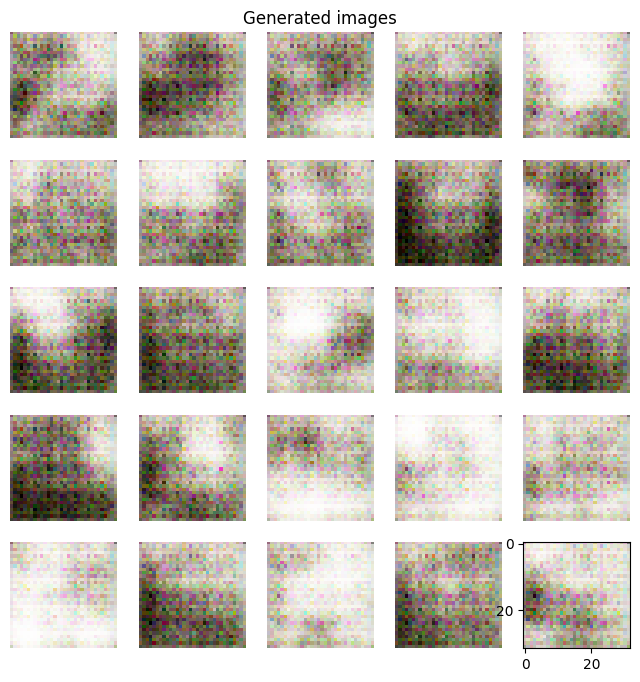

********************
 Epoch 28 and iteration 0 


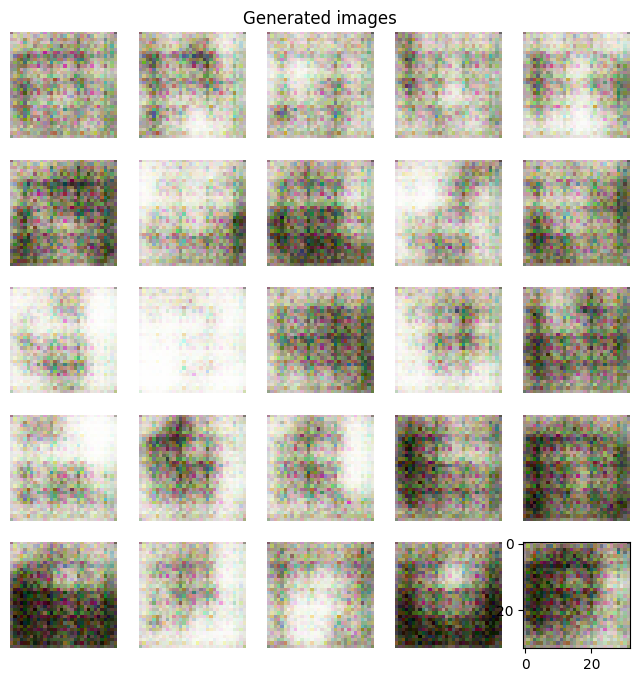

********************
 Epoch 29 and iteration 0 


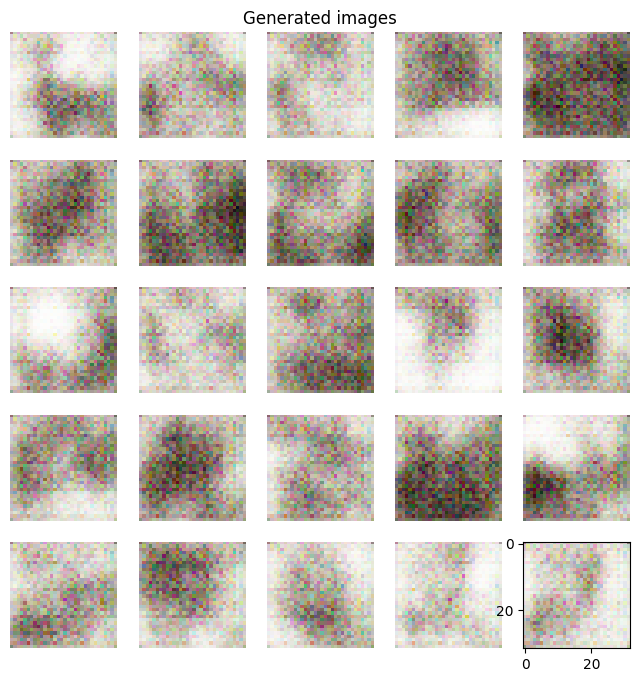

********************
 Epoch 30 and iteration 0 


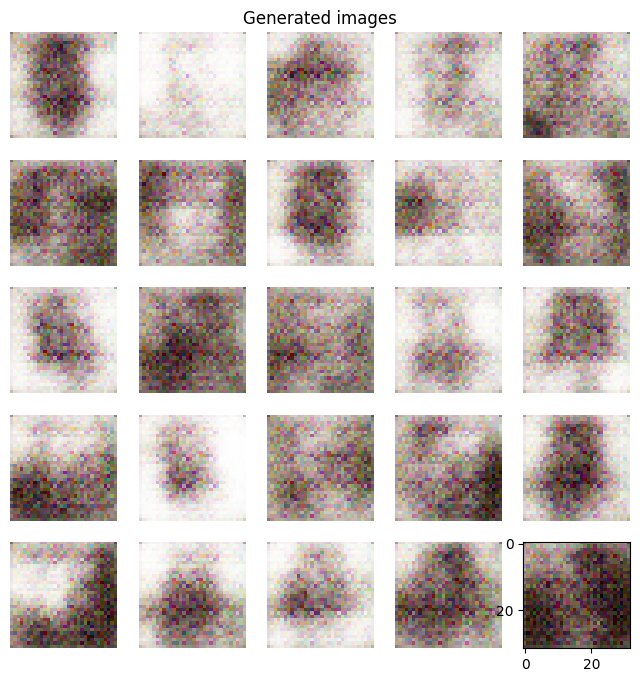

********************
 Epoch 31 and iteration 0 


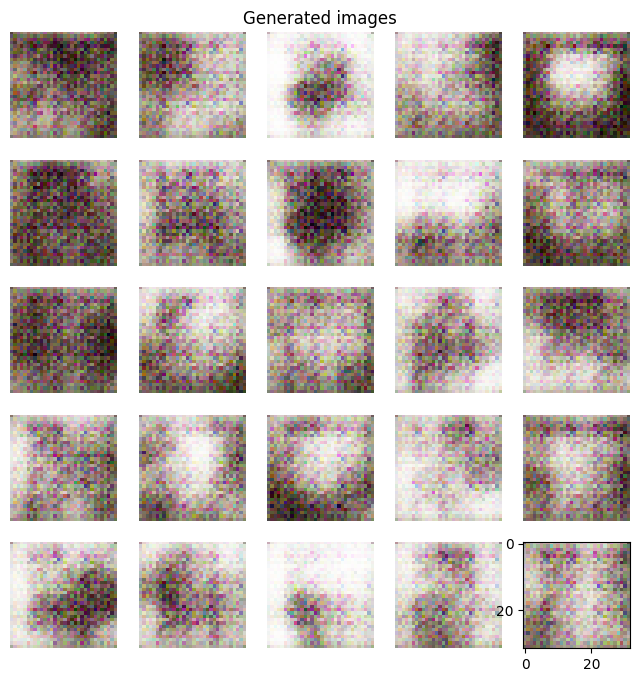

********************
 Epoch 32 and iteration 0 


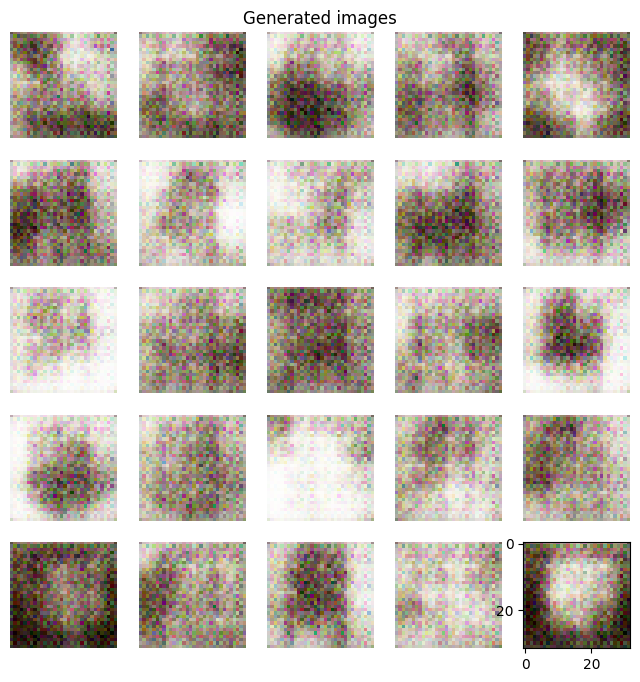

********************
 Epoch 33 and iteration 0 


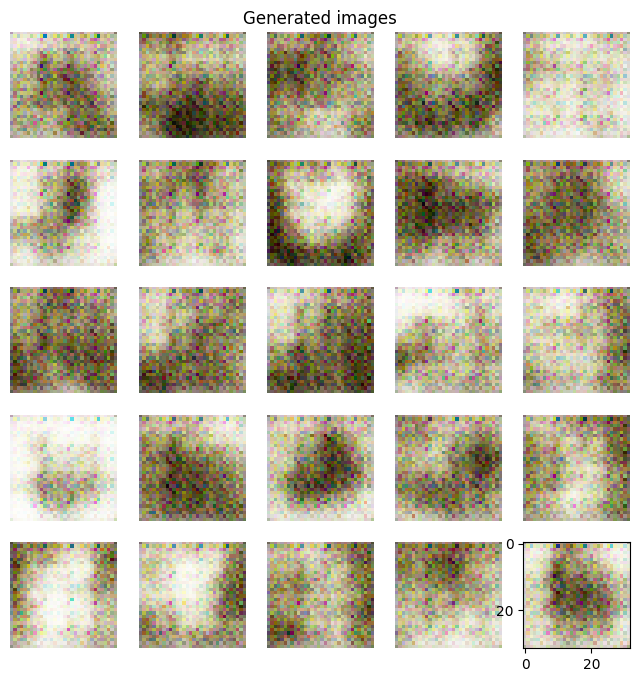

********************
 Epoch 34 and iteration 0 


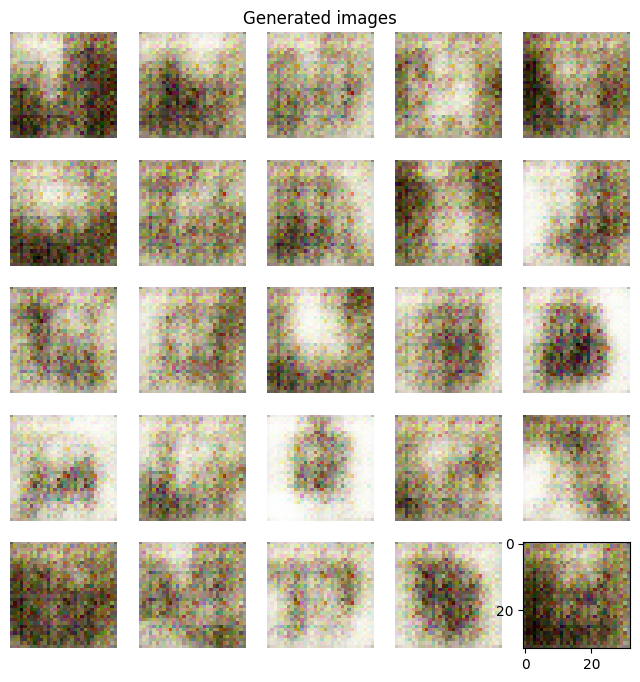

********************
 Epoch 35 and iteration 0 


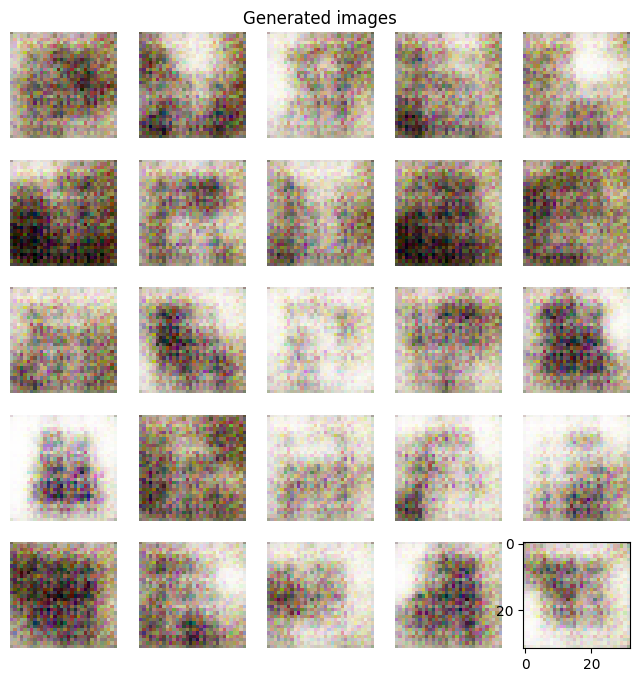

********************
 Epoch 36 and iteration 0 


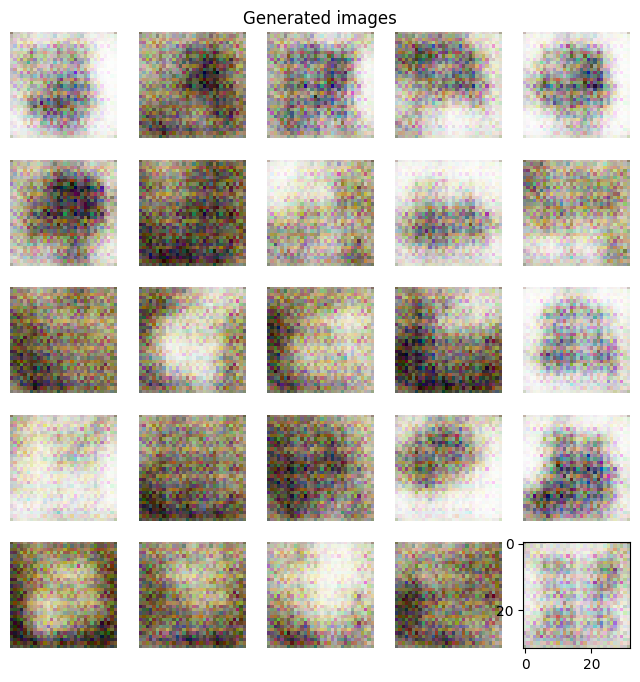

********************
 Epoch 37 and iteration 0 


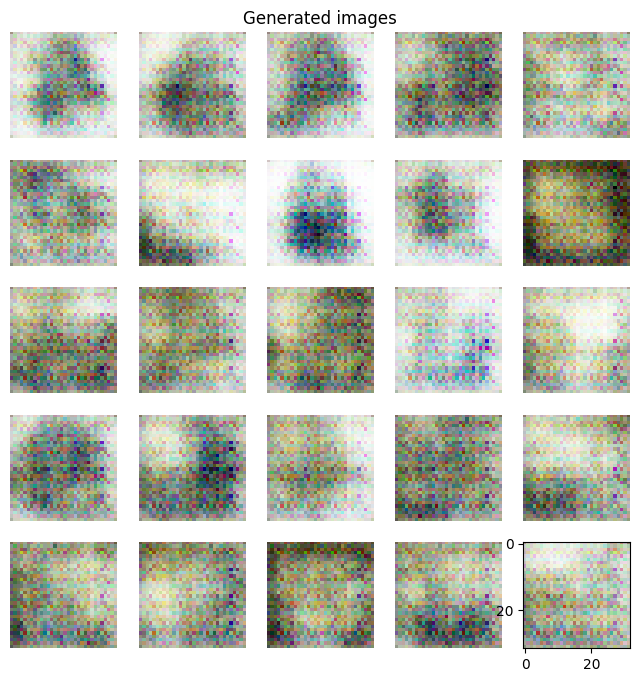

********************
 Epoch 38 and iteration 0 


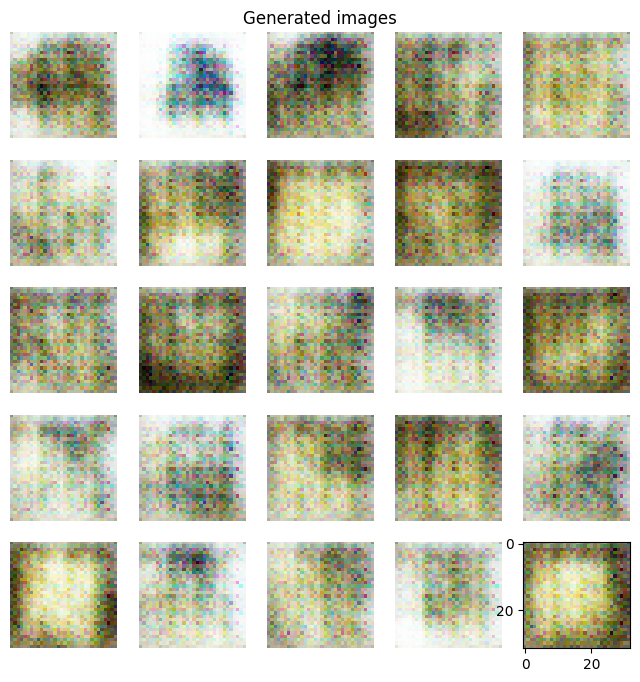

********************
 Epoch 39 and iteration 0 


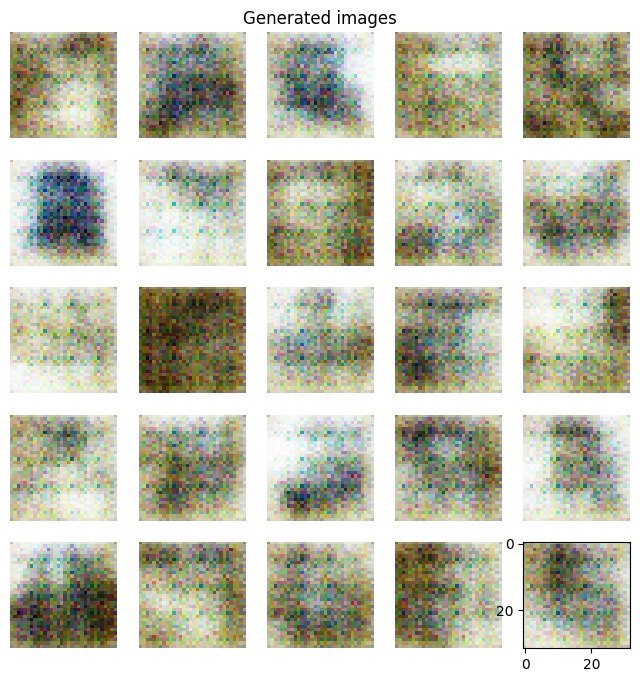

********************
 Epoch 40 and iteration 0 


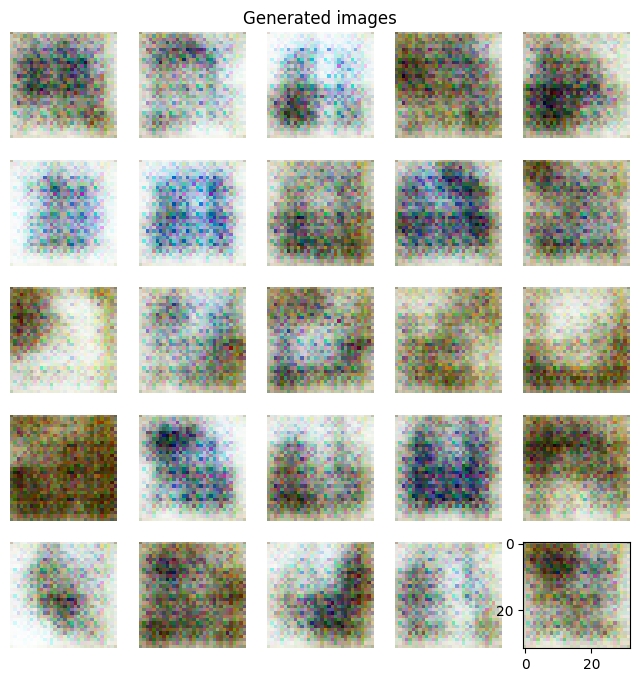

********************
 Epoch 41 and iteration 0 


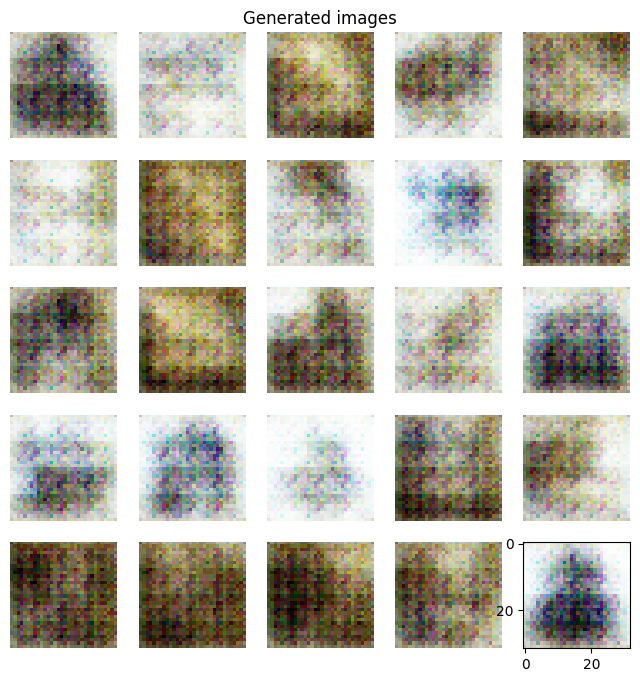

********************
 Epoch 42 and iteration 0 


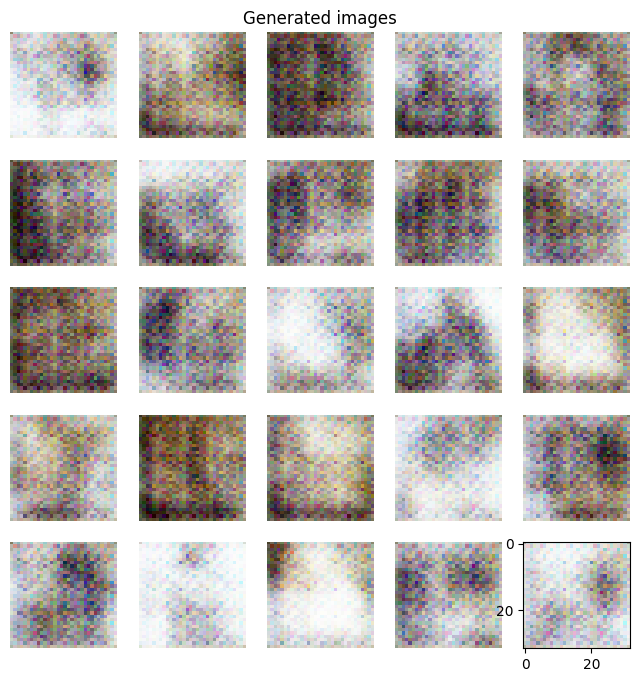

********************
 Epoch 43 and iteration 0 


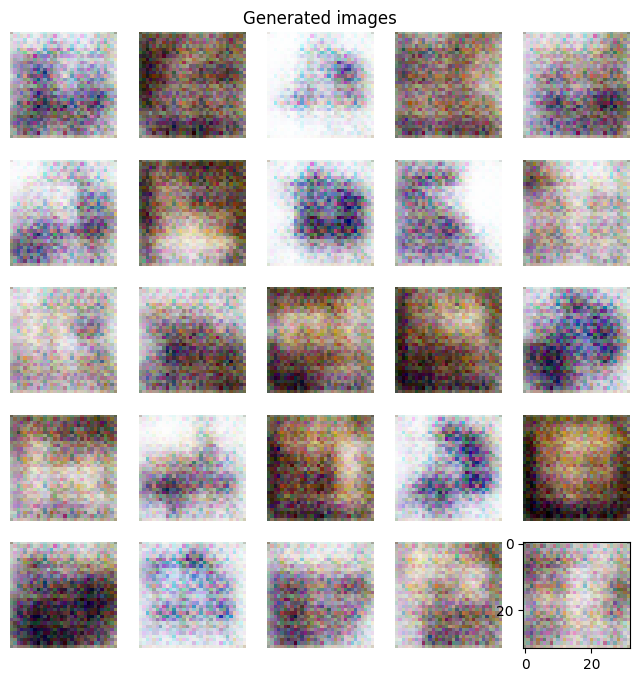

********************
 Epoch 44 and iteration 0 


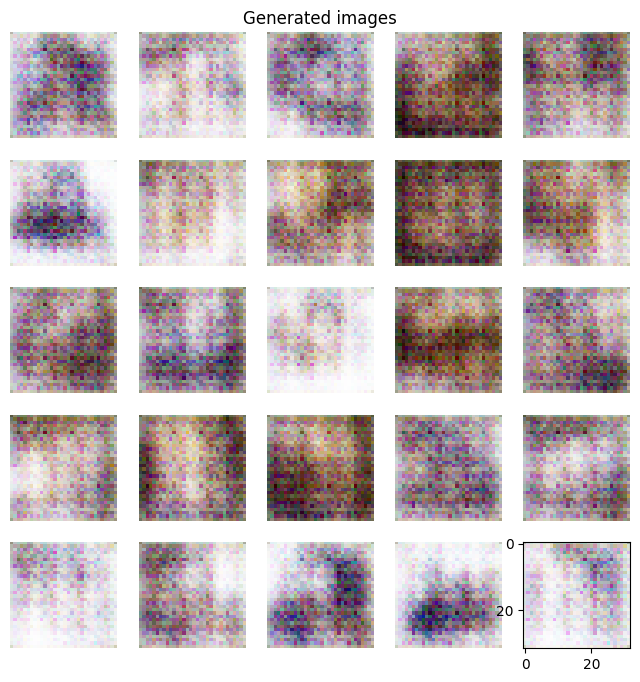

********************
 Epoch 45 and iteration 0 


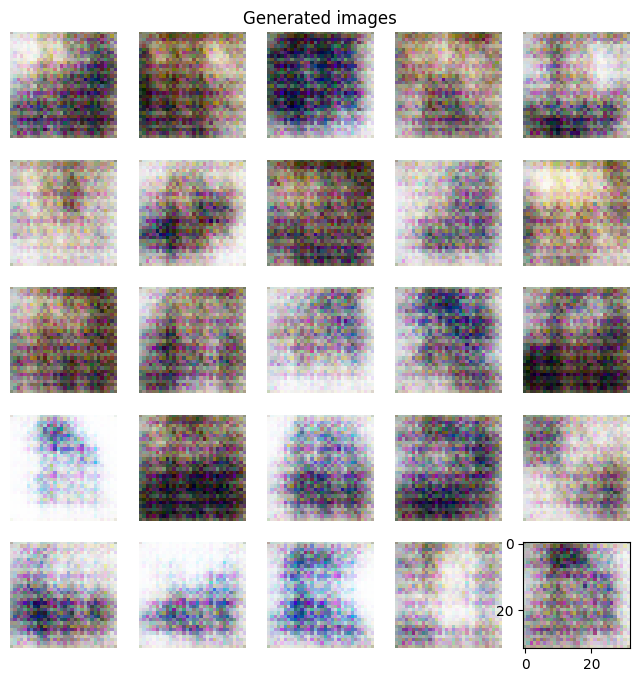

********************
 Epoch 46 and iteration 0 


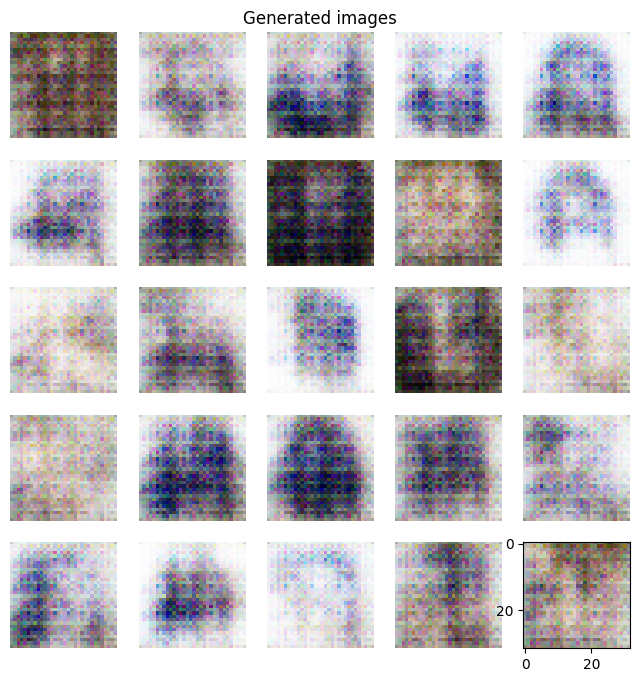

********************
 Epoch 47 and iteration 0 


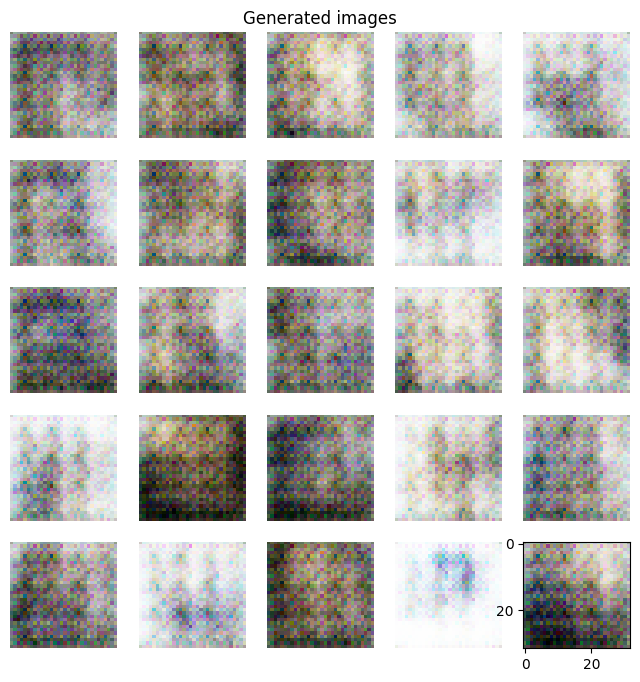

********************
 Epoch 48 and iteration 0 


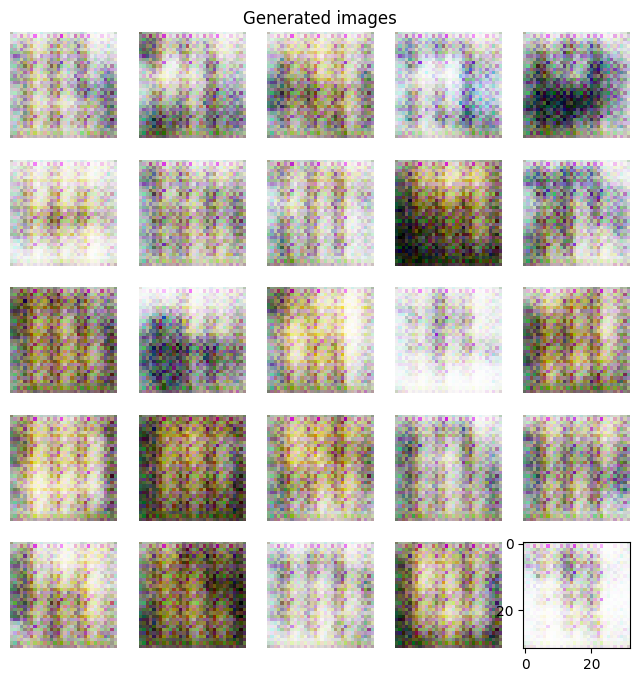

********************
 Epoch 49 and iteration 0 


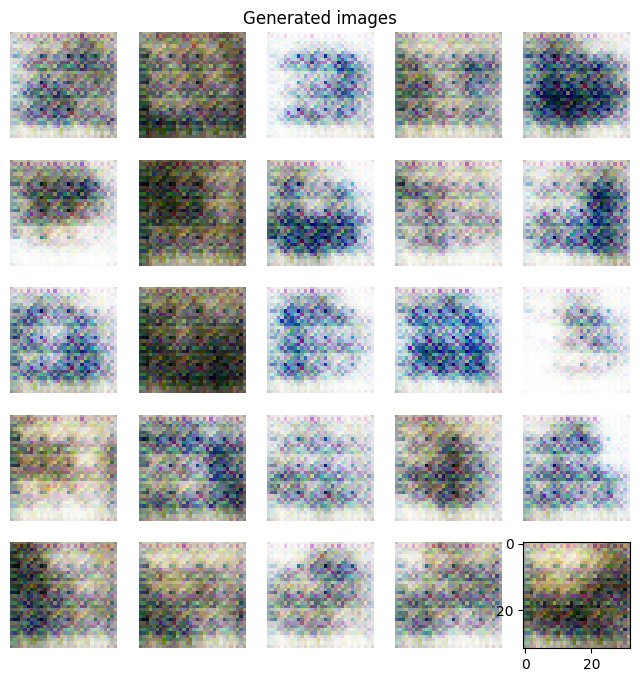

********************
 Epoch 50 and iteration 0 


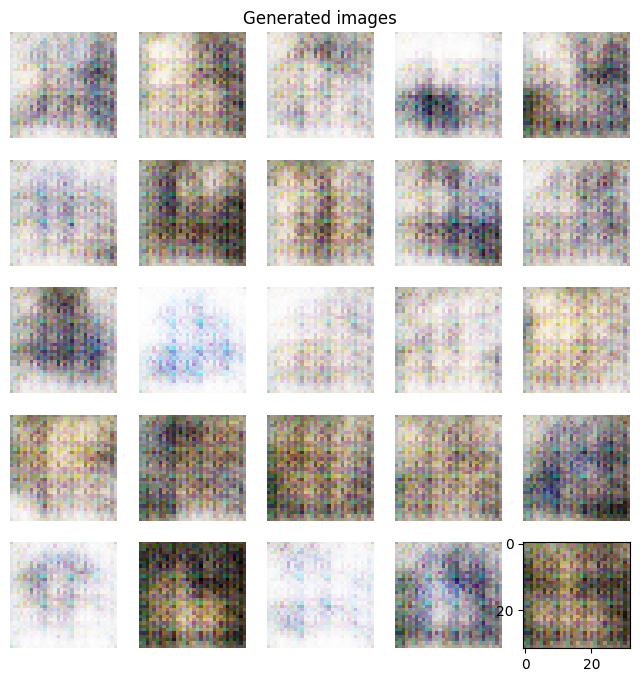

********************
 Epoch 51 and iteration 0 


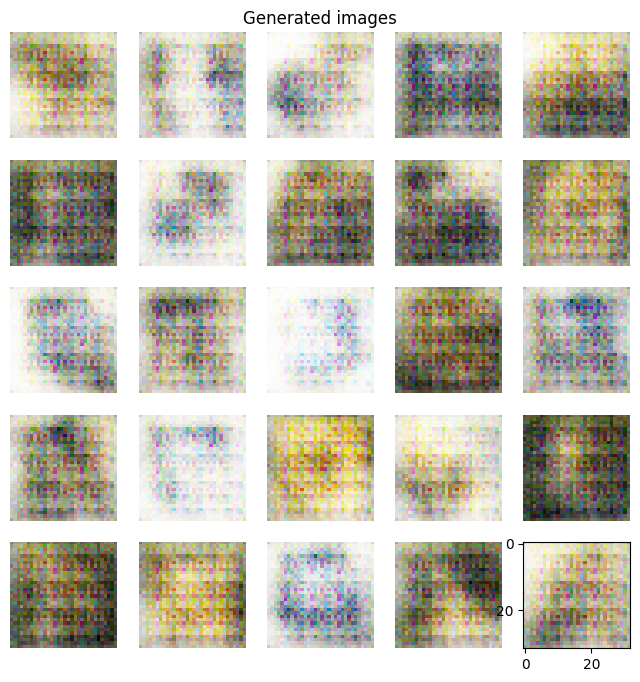

********************
 Epoch 52 and iteration 0 


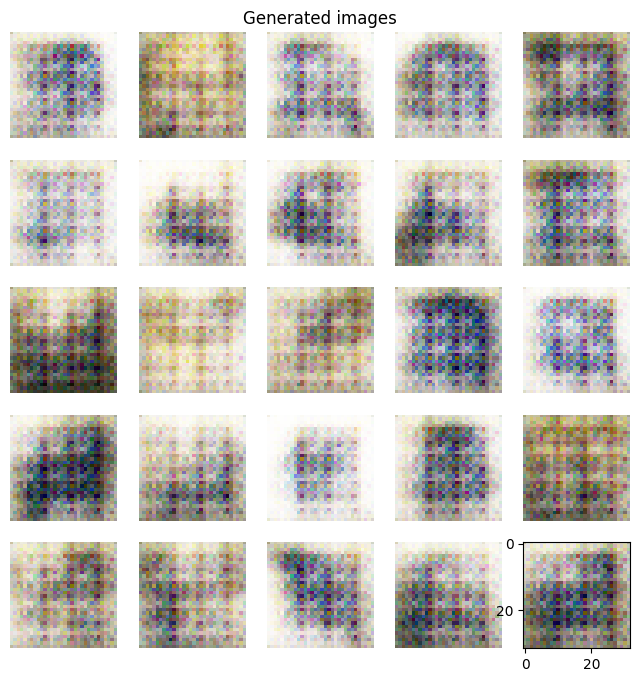

********************
 Epoch 53 and iteration 0 


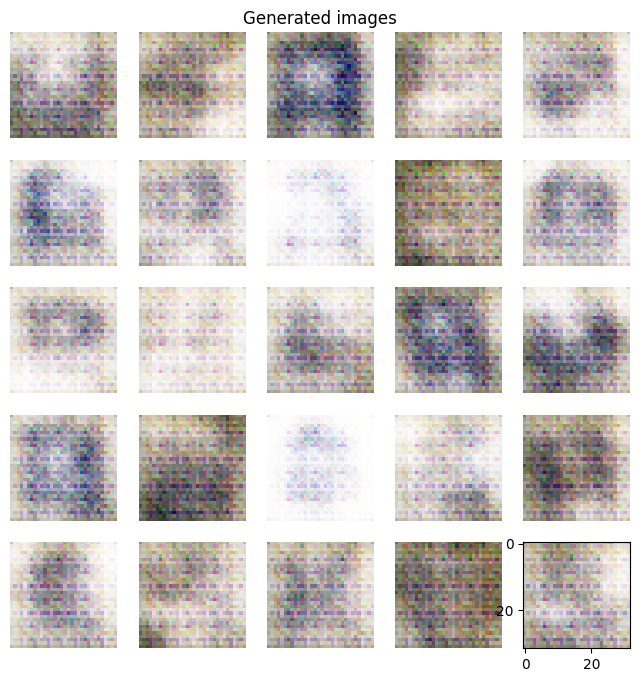

********************
 Epoch 54 and iteration 0 


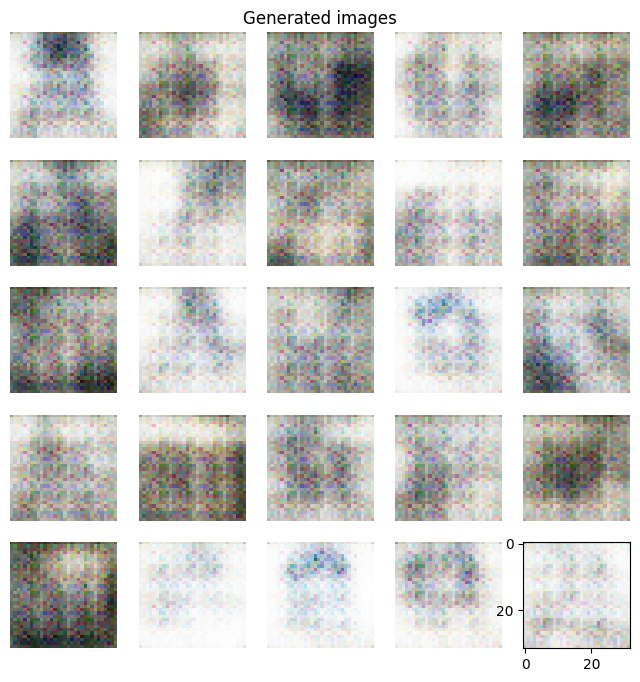

********************
 Epoch 55 and iteration 0 


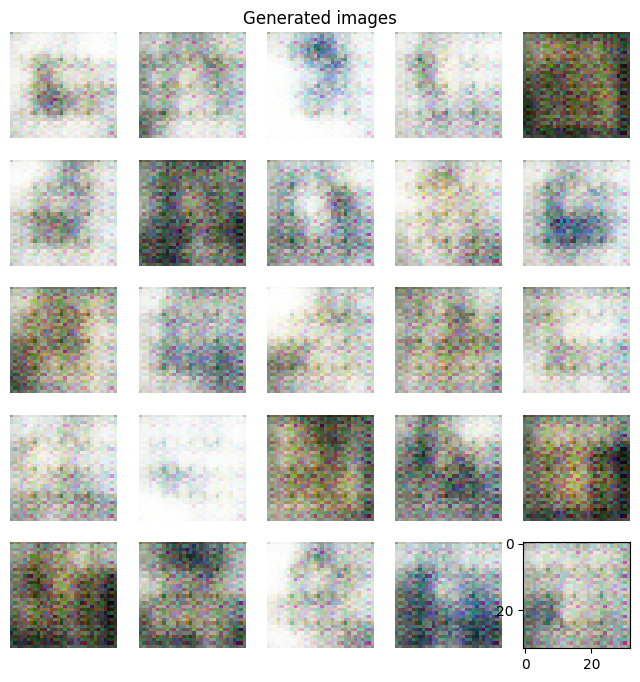

********************
 Epoch 56 and iteration 0 


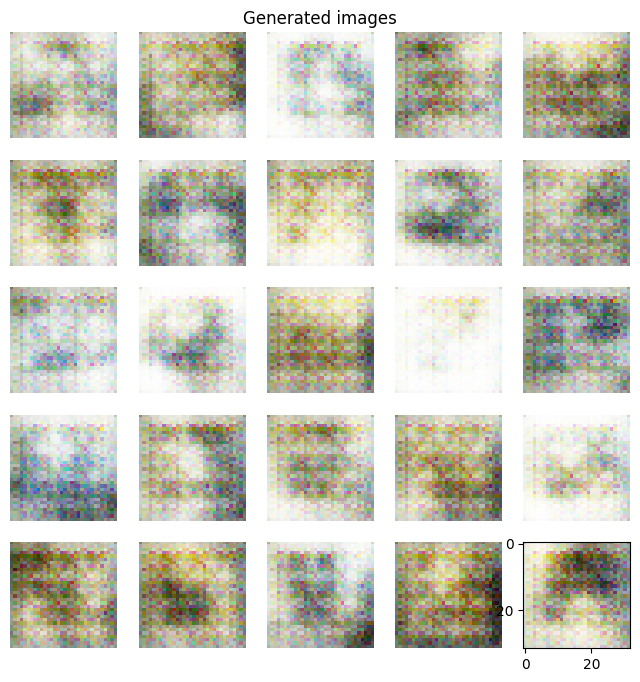

********************
 Epoch 57 and iteration 0 


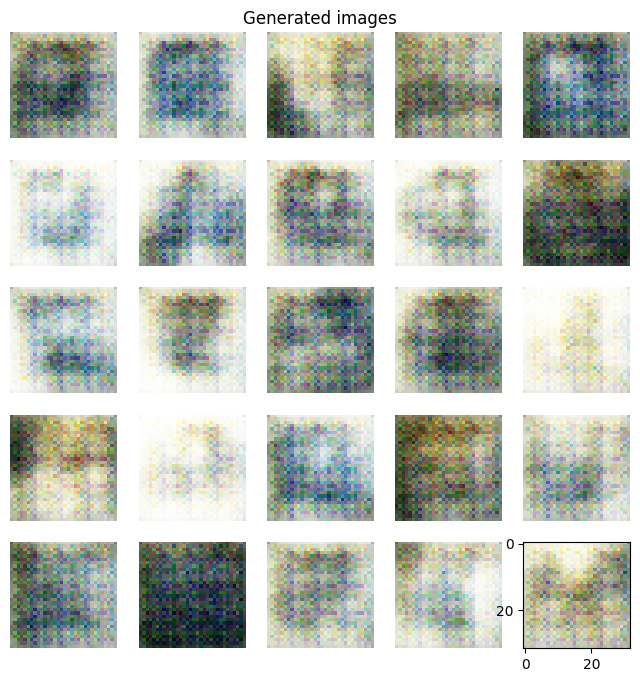

********************
 Epoch 58 and iteration 0 


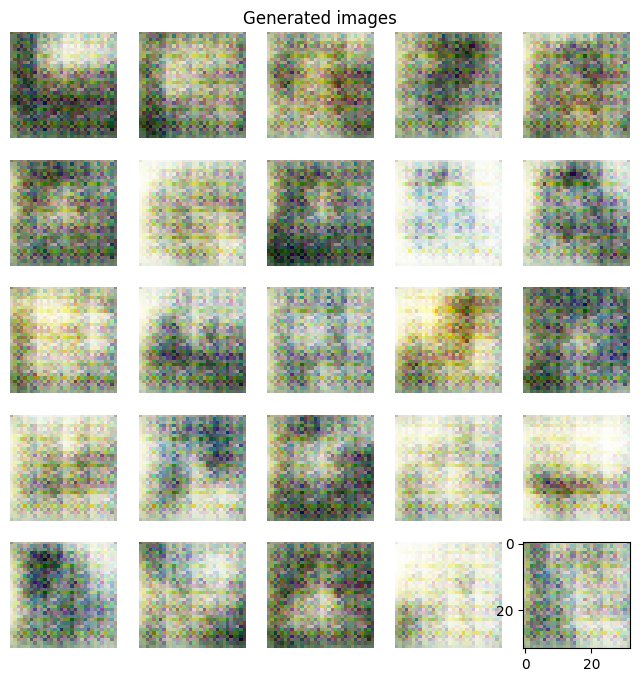

********************
 Epoch 59 and iteration 0 


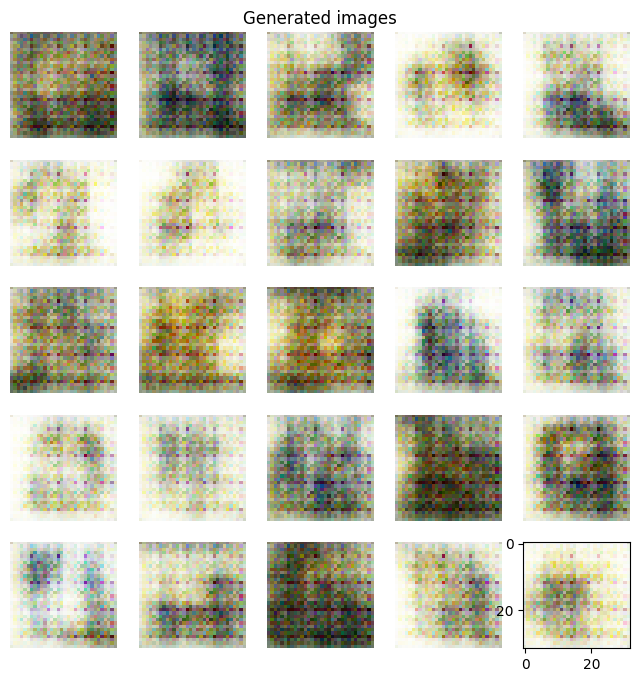

********************
 Epoch 60 and iteration 0 


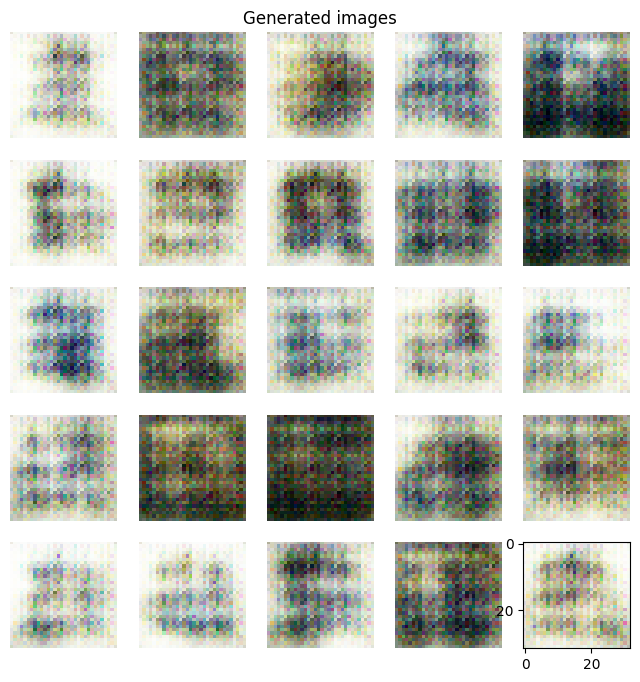

********************
 Epoch 61 and iteration 0 


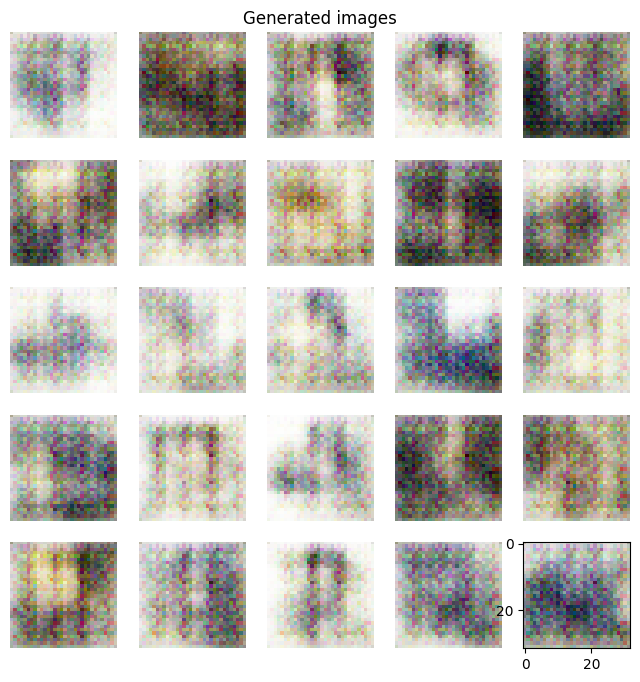

********************
 Epoch 62 and iteration 0 


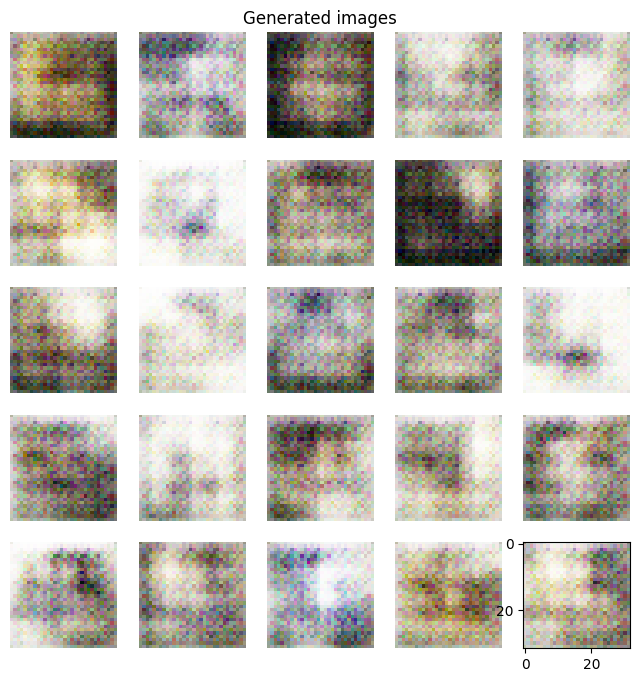

********************
 Epoch 63 and iteration 0 


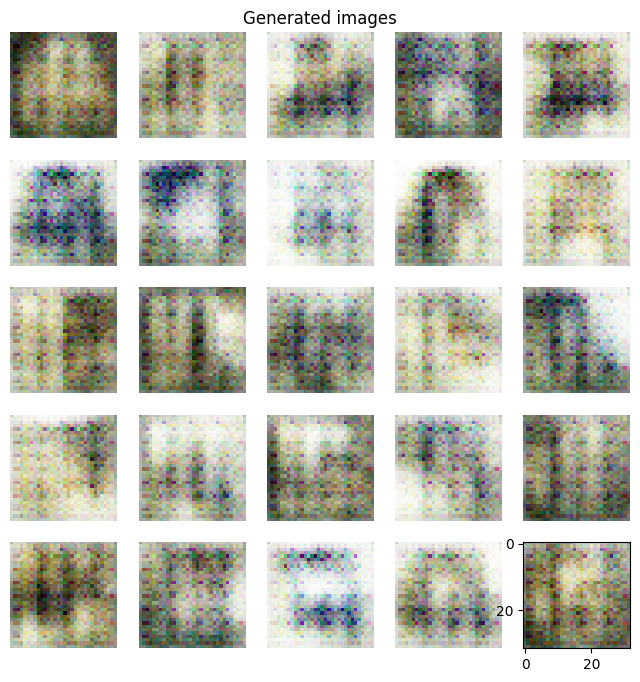

********************
 Epoch 64 and iteration 0 


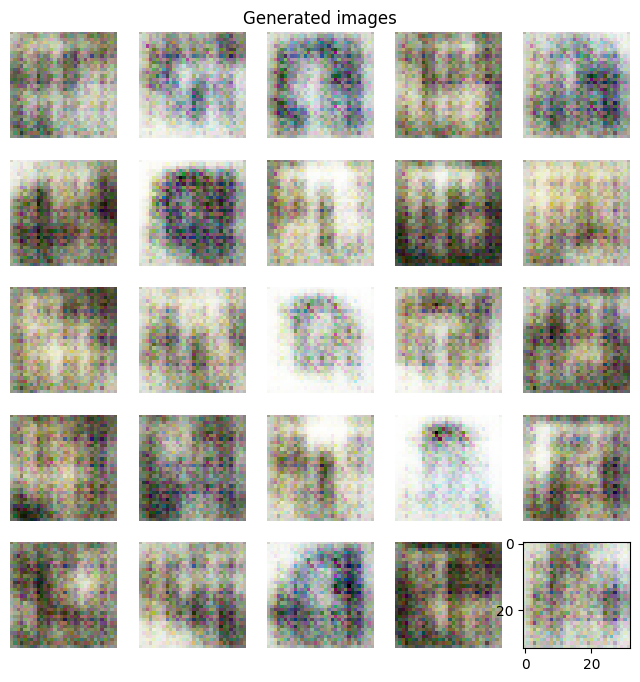

********************
 Epoch 65 and iteration 0 


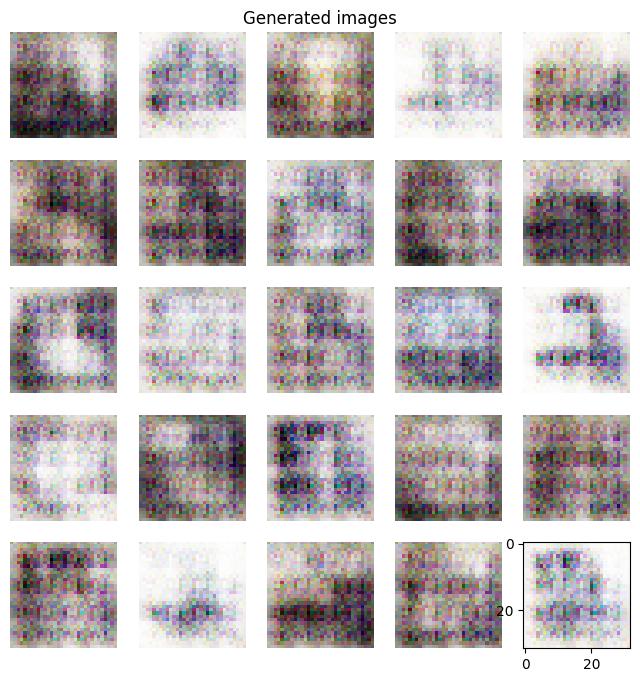

********************
 Epoch 66 and iteration 0 


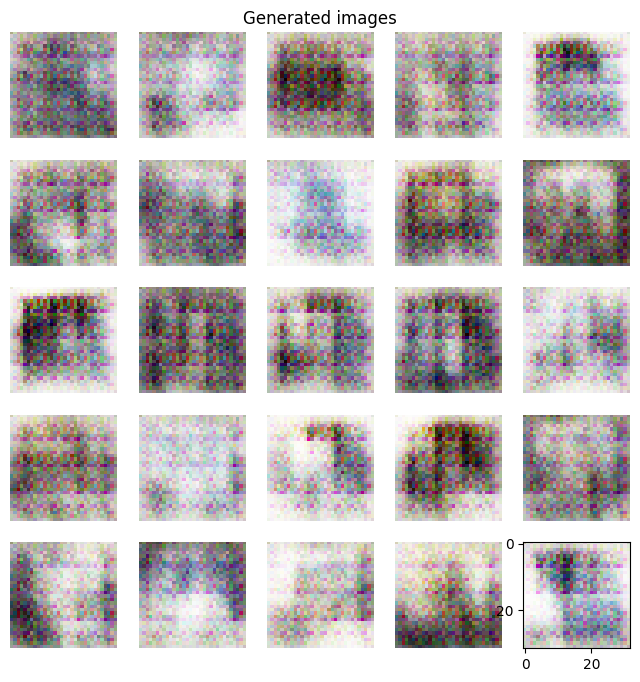

********************
 Epoch 67 and iteration 0 


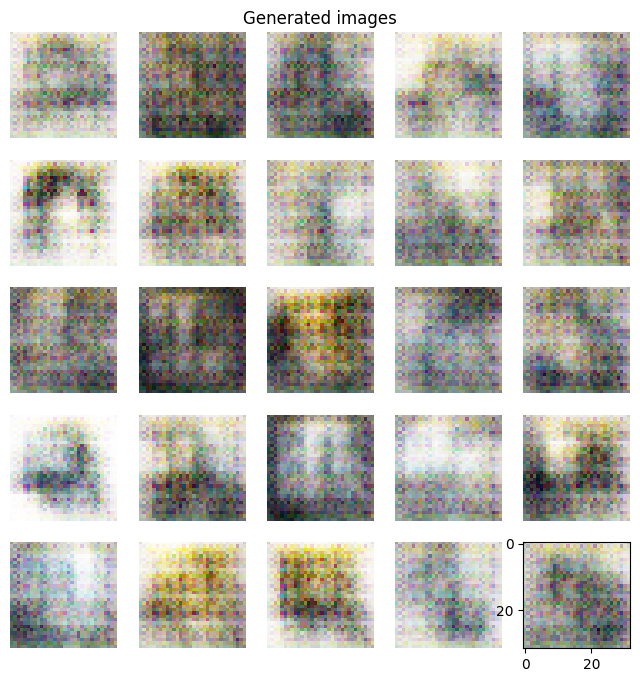

********************
 Epoch 68 and iteration 0 


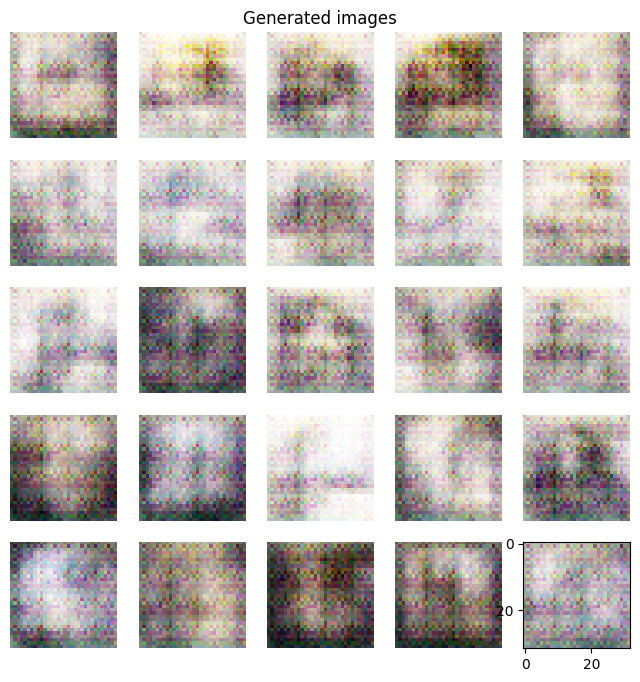

********************
 Epoch 69 and iteration 0 


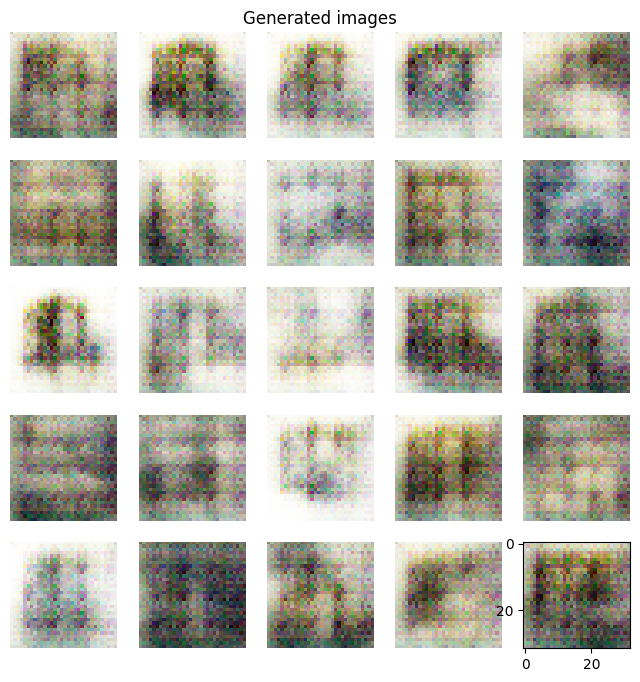

********************
 Epoch 70 and iteration 0 


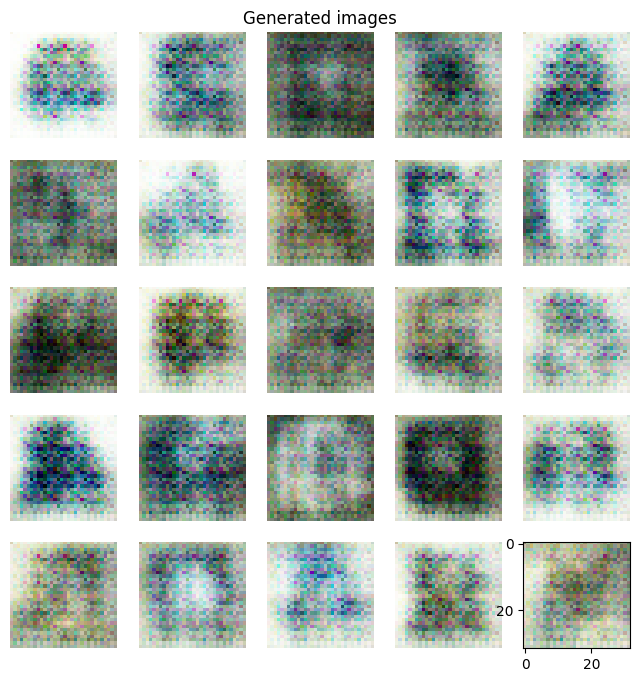

********************
 Epoch 71 and iteration 0 


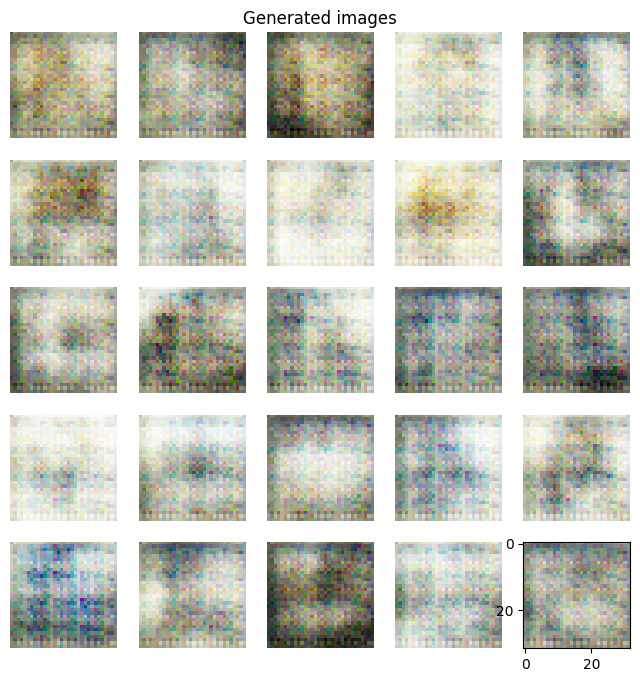

********************
 Epoch 72 and iteration 0 


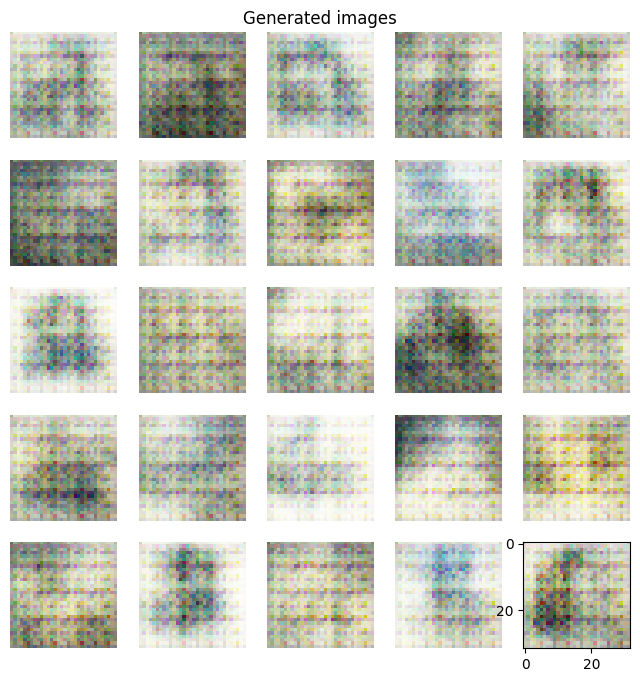

********************
 Epoch 73 and iteration 0 


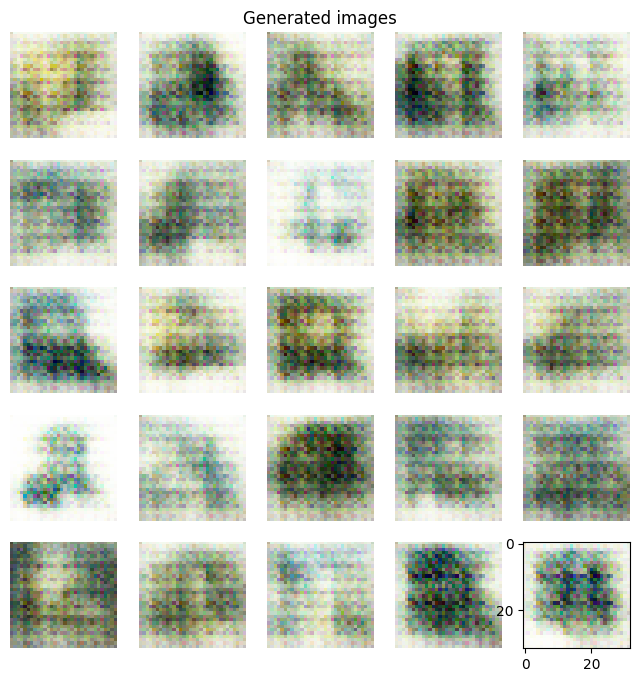

********************
 Epoch 74 and iteration 0 


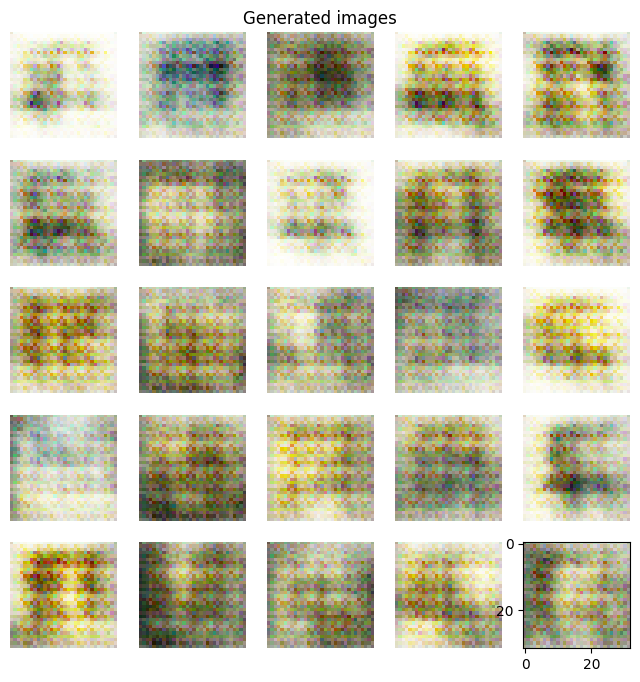

********************
 Epoch 75 and iteration 0 


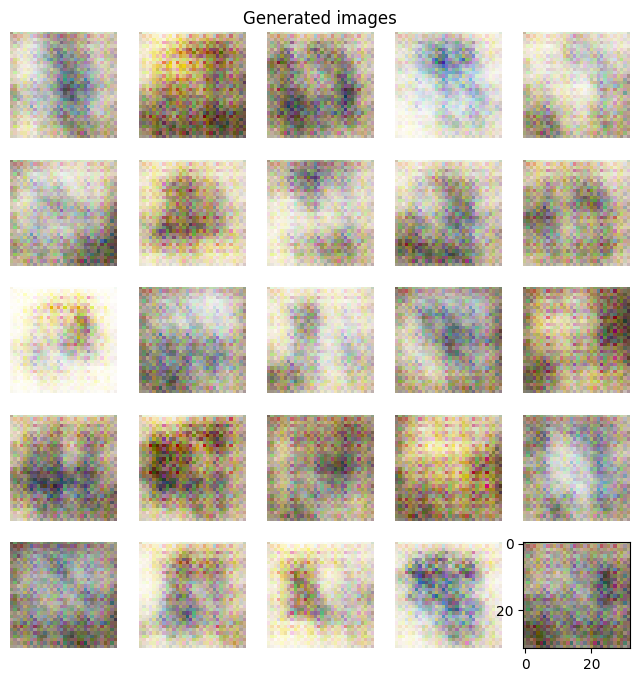

********************
 Epoch 76 and iteration 0 


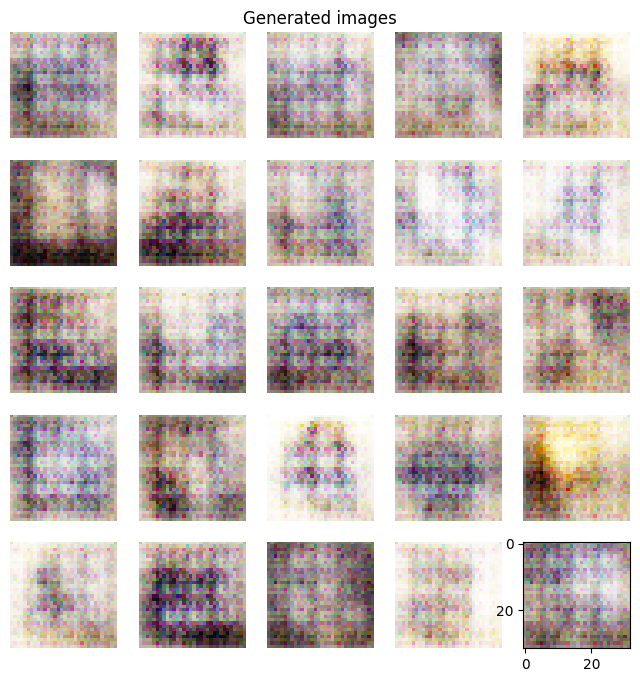

********************
 Epoch 77 and iteration 0 


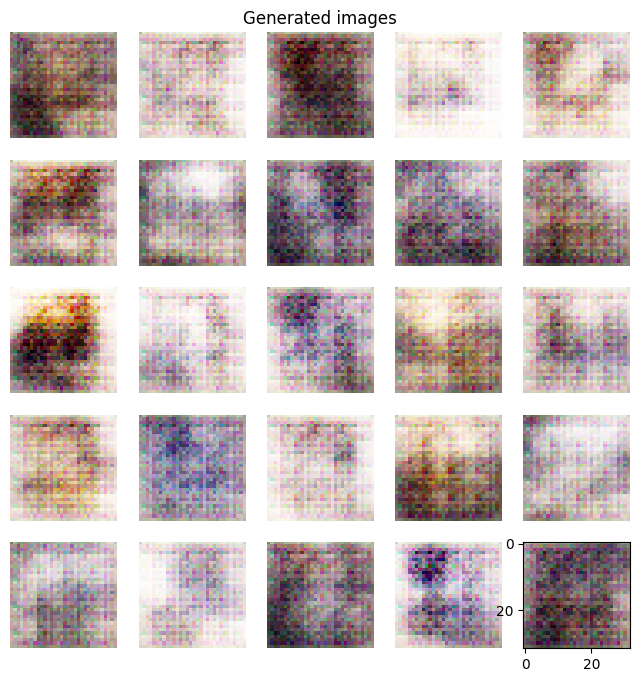

********************
 Epoch 78 and iteration 0 


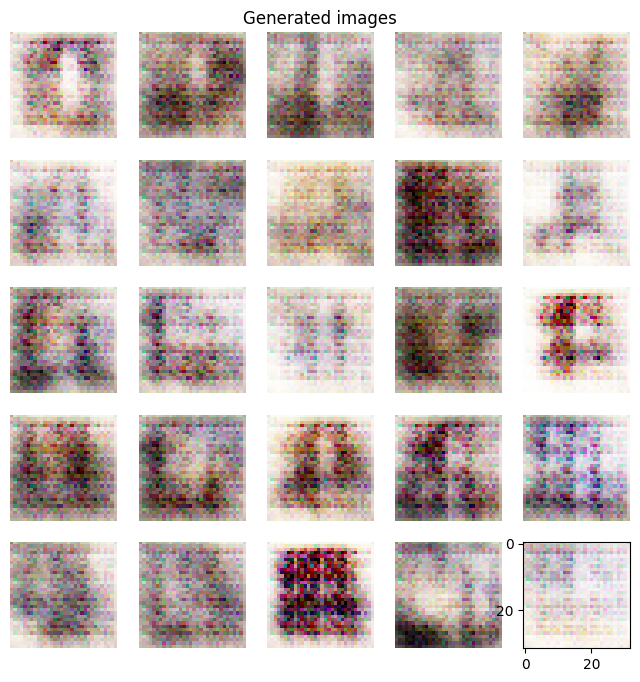

********************
 Epoch 79 and iteration 0 


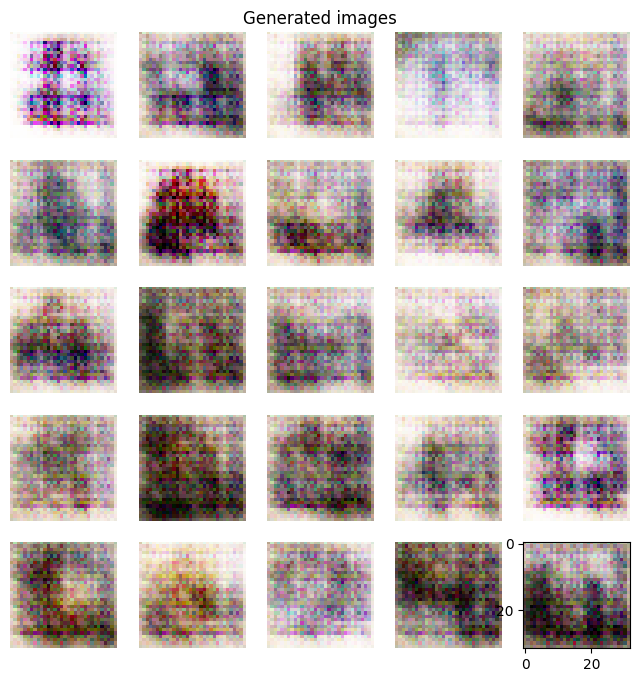

********************
 Epoch 80 and iteration 0 


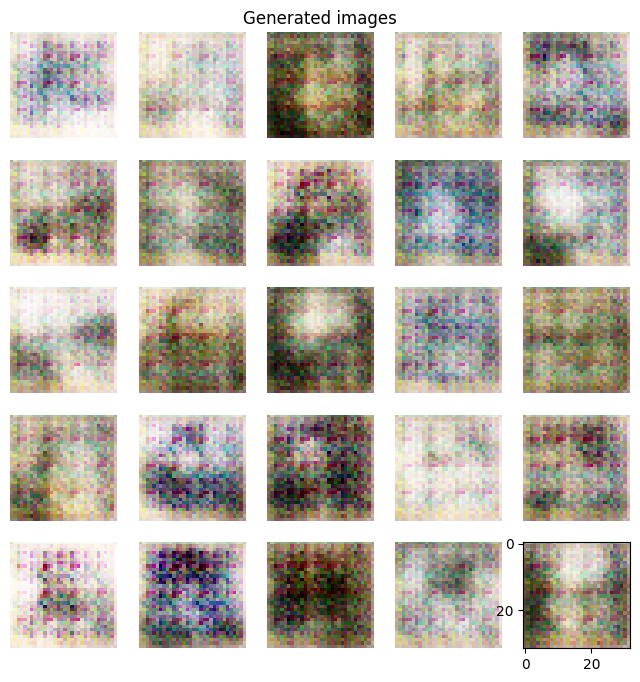

********************
 Epoch 81 and iteration 0 


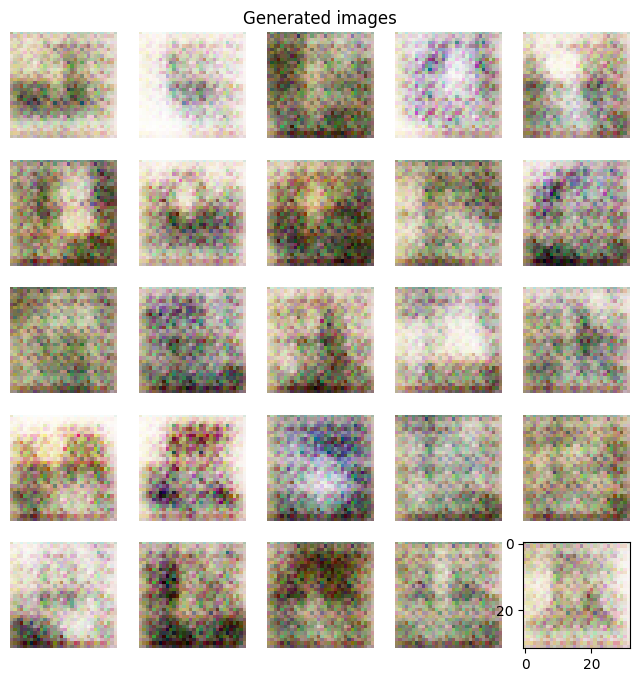

********************
 Epoch 82 and iteration 0 


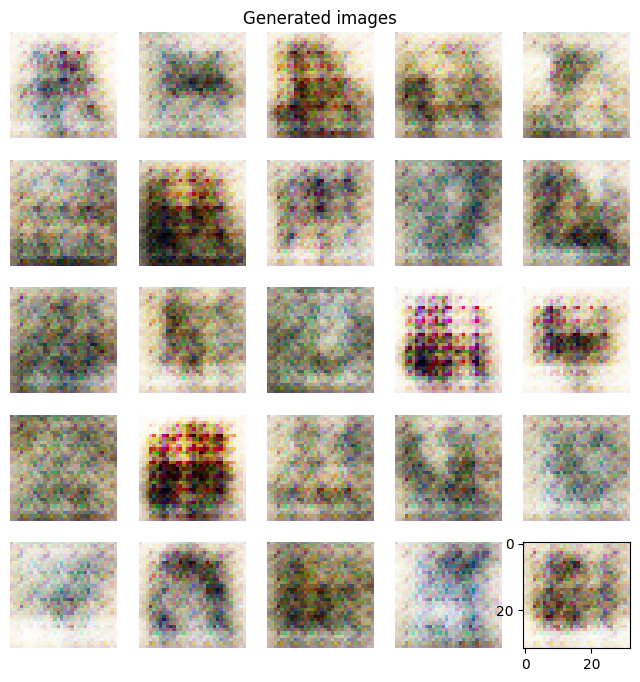

********************
 Epoch 83 and iteration 0 


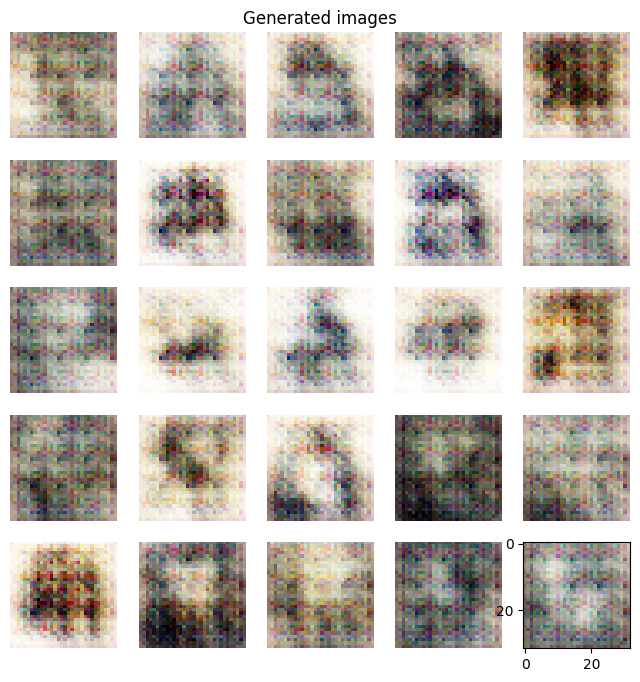

********************
 Epoch 84 and iteration 0 


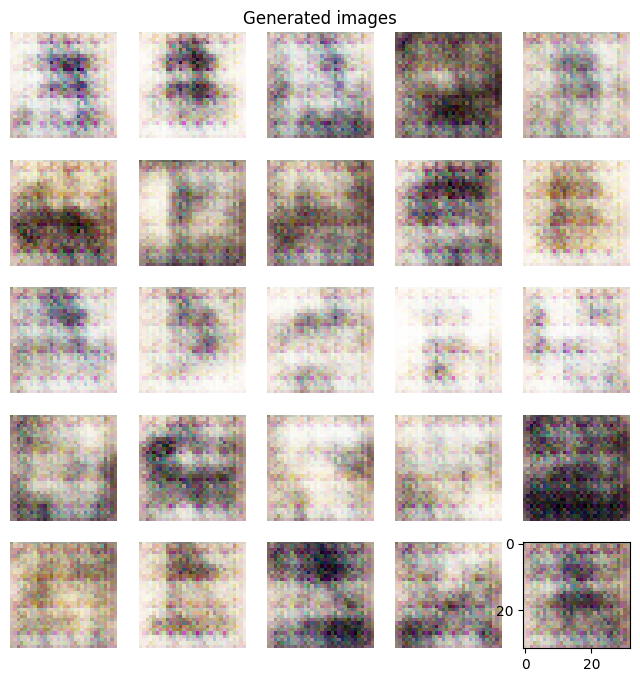

********************
 Epoch 85 and iteration 0 


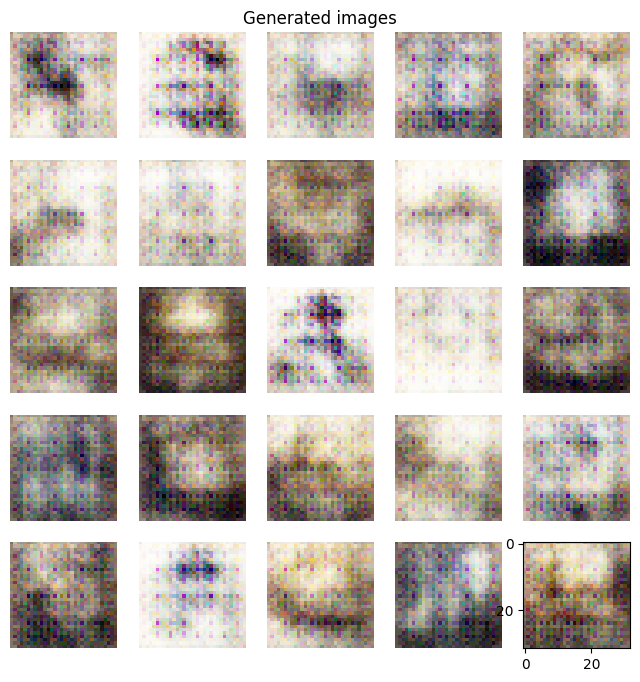

********************
 Epoch 86 and iteration 0 


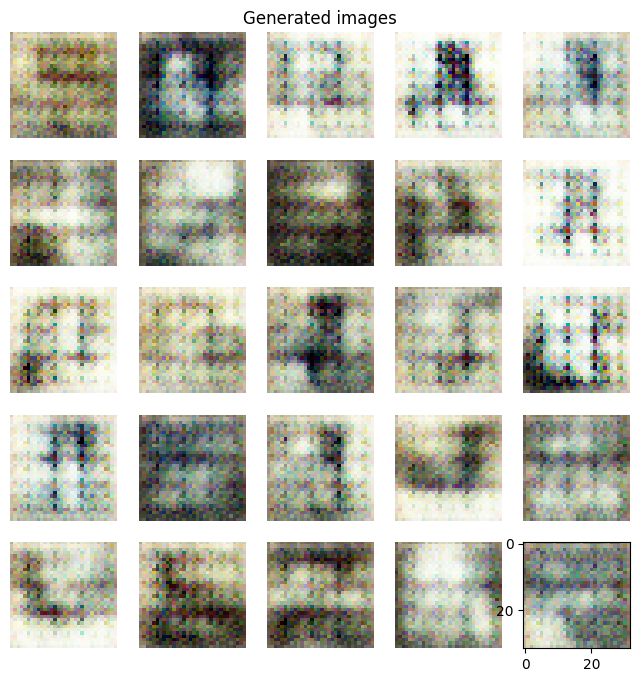

********************
 Epoch 87 and iteration 0 


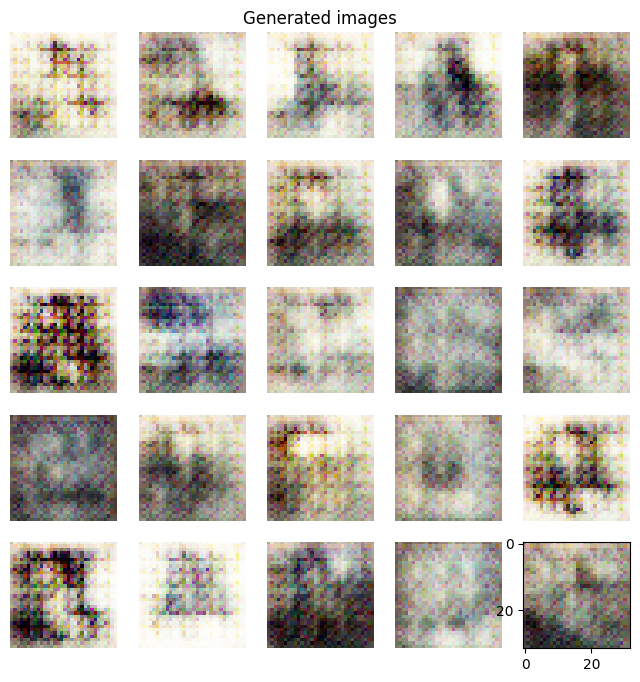

********************
 Epoch 88 and iteration 0 


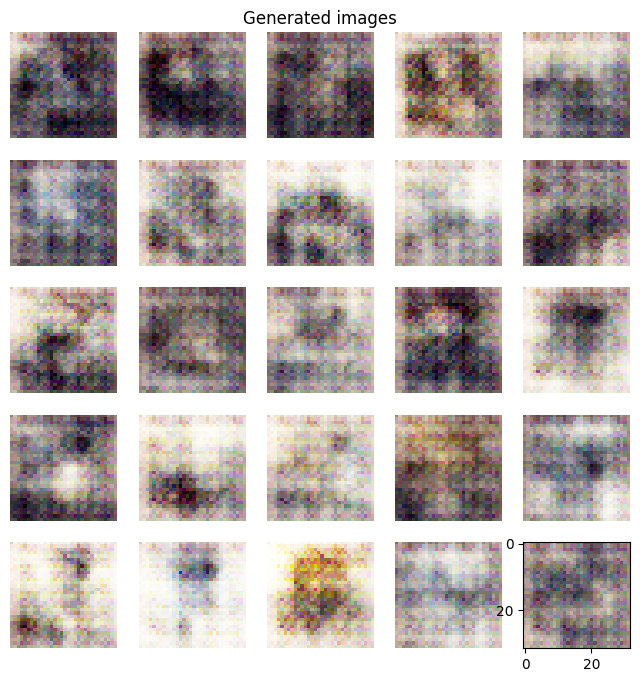

********************
 Epoch 89 and iteration 0 


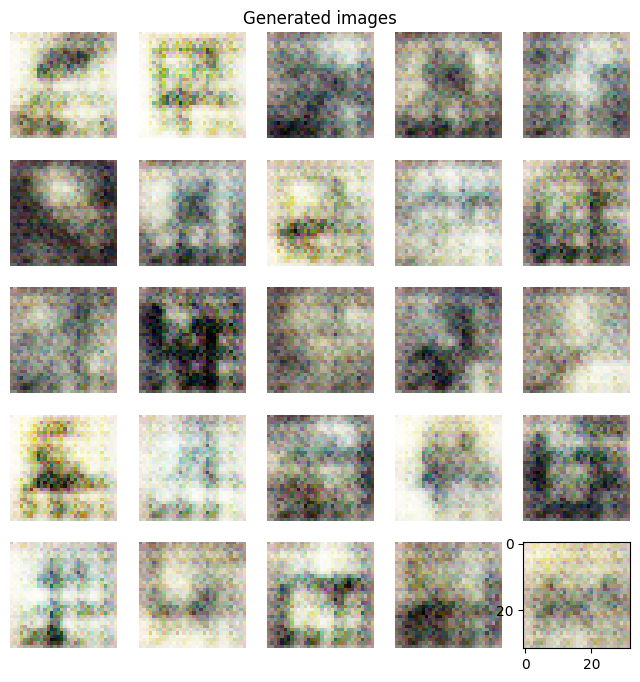

********************
 Epoch 90 and iteration 0 


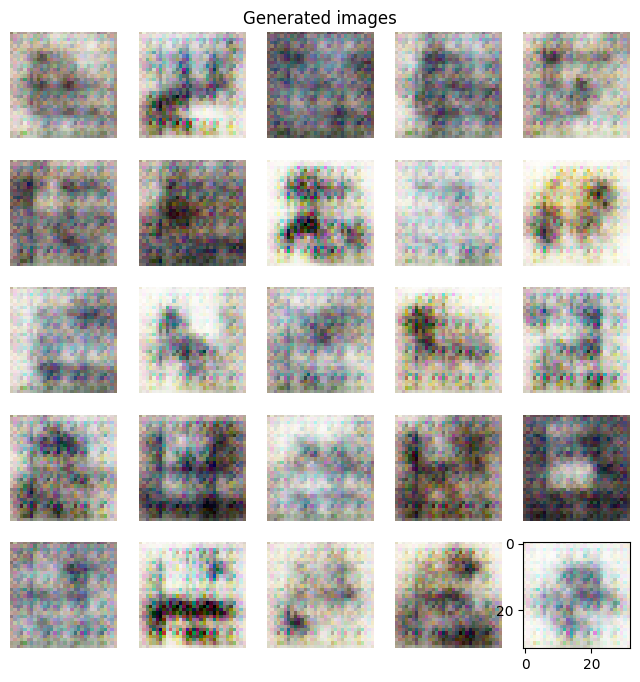

********************
 Epoch 91 and iteration 0 


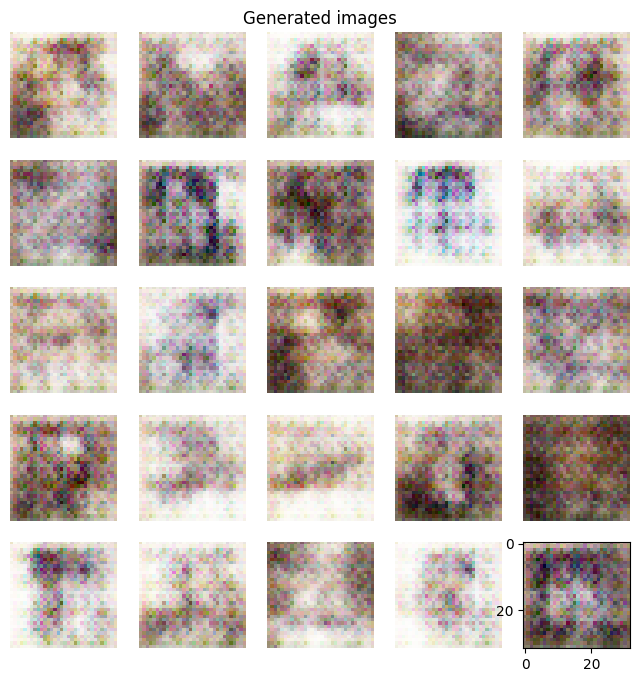

********************
 Epoch 92 and iteration 0 


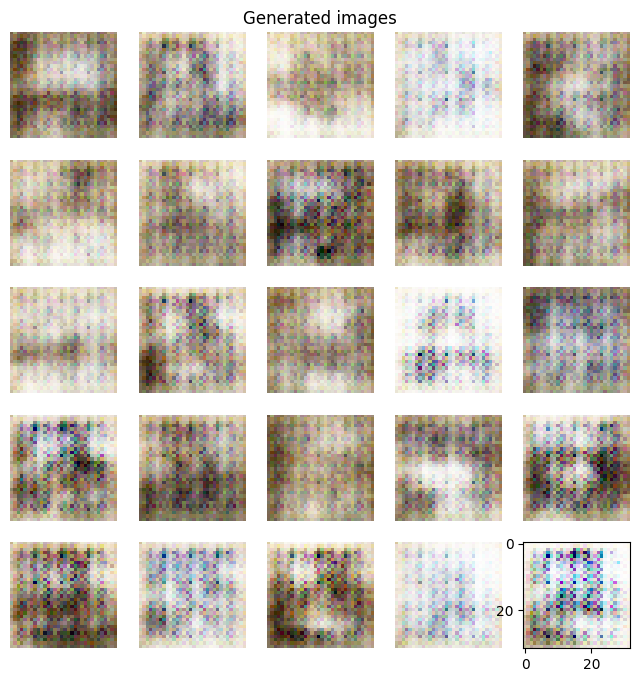

********************
 Epoch 93 and iteration 0 


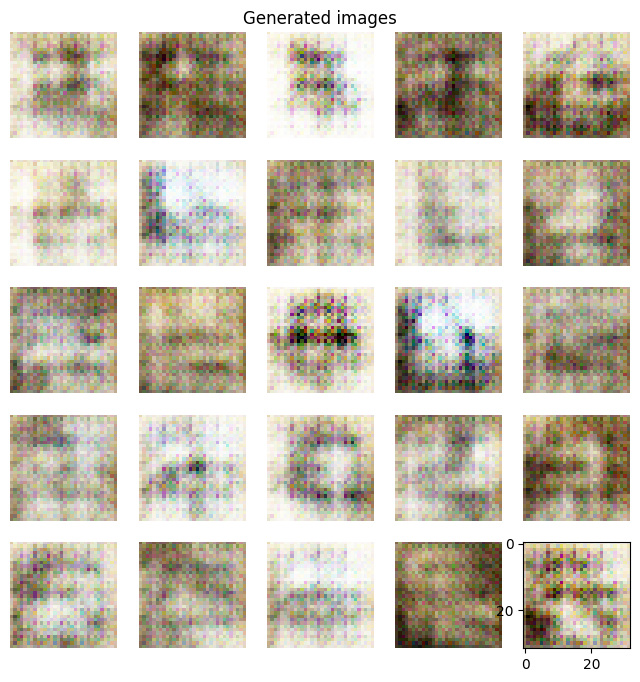

********************
 Epoch 94 and iteration 0 


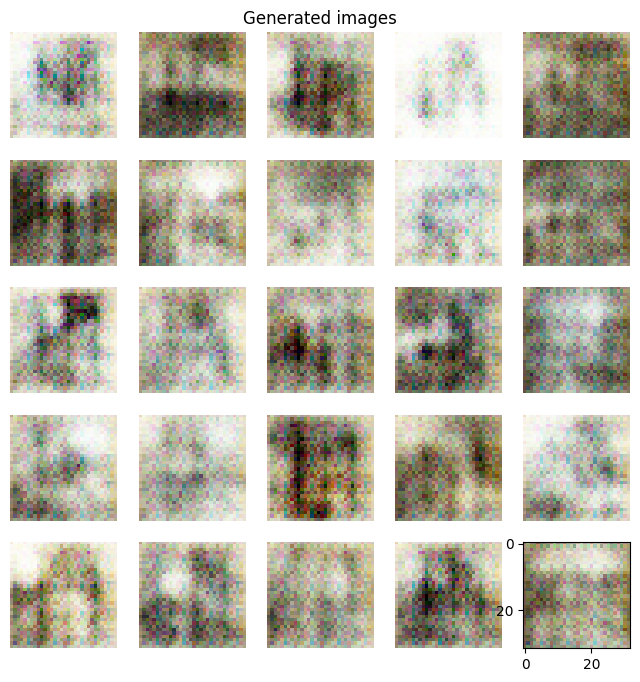

********************
 Epoch 95 and iteration 0 


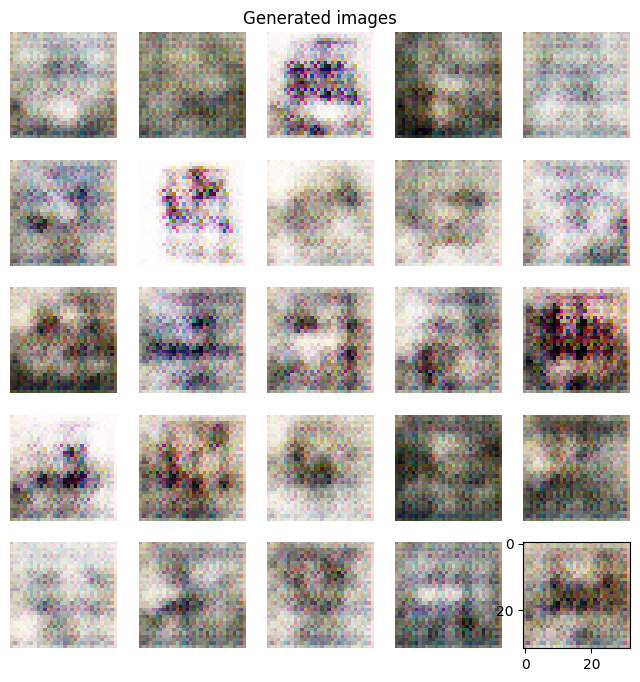

********************
 Epoch 96 and iteration 0 


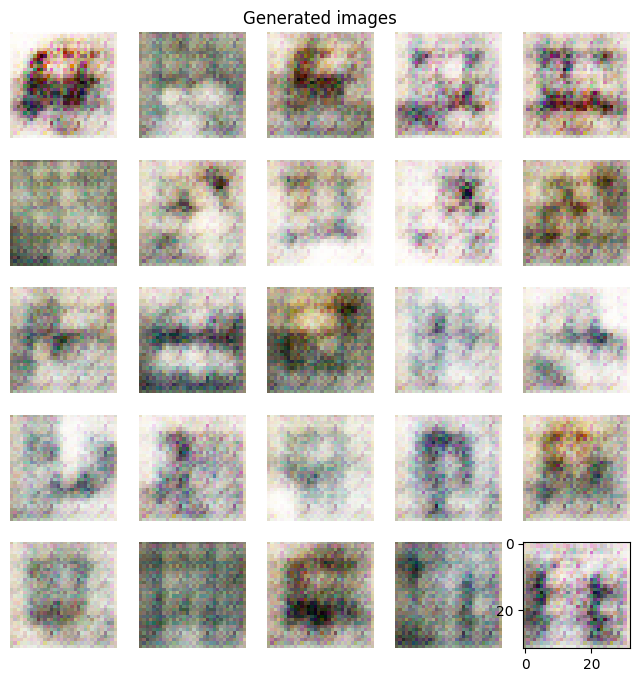

********************
 Epoch 97 and iteration 0 


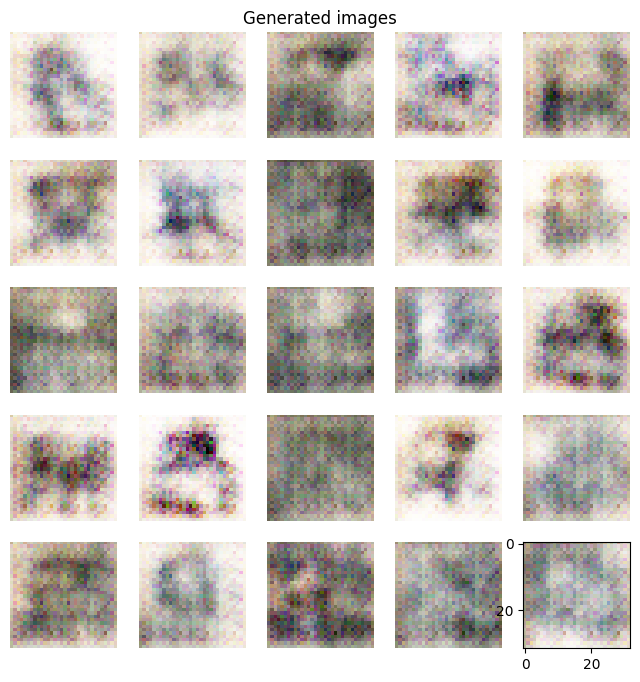

********************
 Epoch 98 and iteration 0 


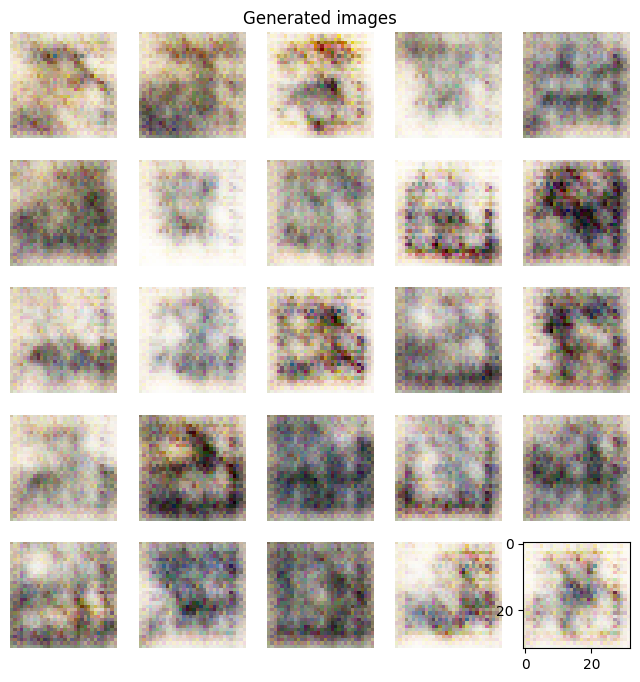

********************
 Epoch 99 and iteration 0 


In [73]:
epochs = 100
GenLoss={}
Dloss={}

# going over the entire dataset 10 times
for e in range(epochs):

    # pick each batch b of input images: shape of each batch is (32, 3, 32, 32)
    for i, b in enumerate(dataloader):

        ##########################
        ## Update Discriminator ##
        ##########################

        # Loss on real images

        # clear the gradient
        opt_D.zero_grad() # set the gradients to 0 at start of each loop because gradients are accumulated on subsequent backward passes
        # compute the D model output
        yhat = netD(b.to(device)).view(-1) # view(-1) reshapes a 4-d tensor of shape (2,1,1,1) to 1-d tensor with 2 values only
        # specify target labels or true labels
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_real = loss(yhat, target)

        # calculate gradients -  or rather accumulation of gradients on loss tensor
        loss_real.backward()




        # Loss on fake images

        # generate batch of fake images using G
        # Step1: creating noise to be fed as input to G
        noise = torch.randn(len(b), 100, 1, 1, device = device)
        # Step 2: feed noise to G to create a fake img (this will be reused when updating G)
        fake_img = netG(noise)

        # compute D model output on fake images
        yhat = netD.cuda()(fake_img.detach()).view(-1) # .cuda() is essential because our input i.e. fake_img is on gpu but model isnt (runtimeError thrown); detach is imp: Basically, only track steps on your generator optimizer when training the generator, NOT the discriminator.
        # specify target labels
        target = torch.zeros(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_fake = loss(yhat, target)
        # calculate gradients
        loss_fake.backward()

        # total error on D
        loss_disc = loss_real + loss_fake
        numpyint = np.int(loss_disc.item() * 1000)
        Dloss[e]=numpyint
        # Update weights of D
        opt_D.step()

        ##########################
        #### Update Generator ####
        ##########################

        # clear gradient
        opt_G.zero_grad()
        # pass fake image through D
        yhat = netD.cuda()(fake_img).view(-1)
        # specify target variables - remember G wants D *to think* these are real images so label is 1
        target = torch.ones(len(b), dtype=torch.float, device=device)
        # calculate loss
        loss_gen = loss(yhat, target)
        numpy_int = np.int(loss_gen.item() * 1000)
        GenLoss[e] = numpy_int
        # calculate gradients
        loss_gen.backward()
        # update weights on G
        opt_G.step()


        ####################################
        #### Plot some Generator images ####
        ####################################

        # during every epoch, print images at every 10th iteration.
        if i% 10 == 0:
            # convert the fake images from (b_size, 3, 32, 32) to (b_size, 32, 32, 3) for plotting
            img_plot = np.transpose(fake_img.detach().cpu(), (0,2,3,1)) # .detach().cpu() is imp for copying fake_img tensor to host memory first
            plot_images(img_plot)
           # preprocess_images(fake_img[1])
            print("********************")
            print(" Epoch %d and iteration %d " % (e, i))

# generated_images = preprocess_images(fake_img)  # Preprocess your generated images
# is_score = calculate_is(generated_images)
# print("Inception Score:", is_score)

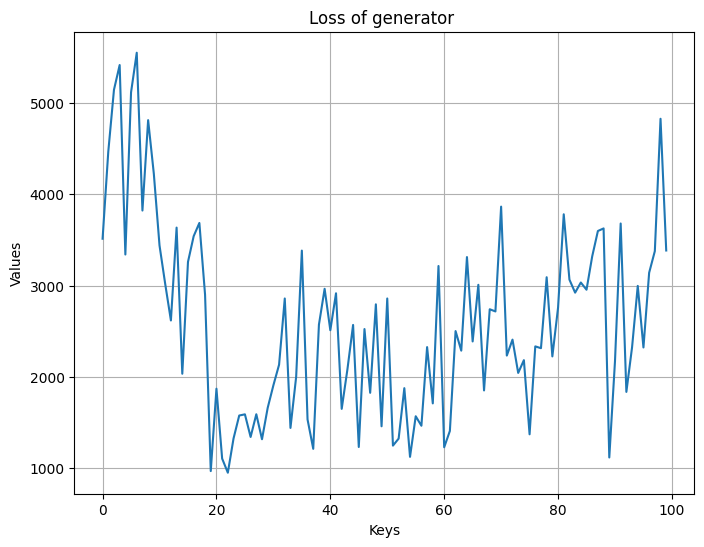

In [74]:

import matplotlib.pyplot as plt

# Extract keys and values
x = list(GenLoss.keys())
y = list(GenLoss.values())

# Plotting the graph as a line plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.plot(x, y, linestyle='-')  # 'marker' sets point style, 'linestyle' sets line style
plt.xlabel('Keys')
plt.ylabel('Values')
plt.title('Loss of generator ')
plt.grid(True)  # Add grid lines if desired
plt.show()


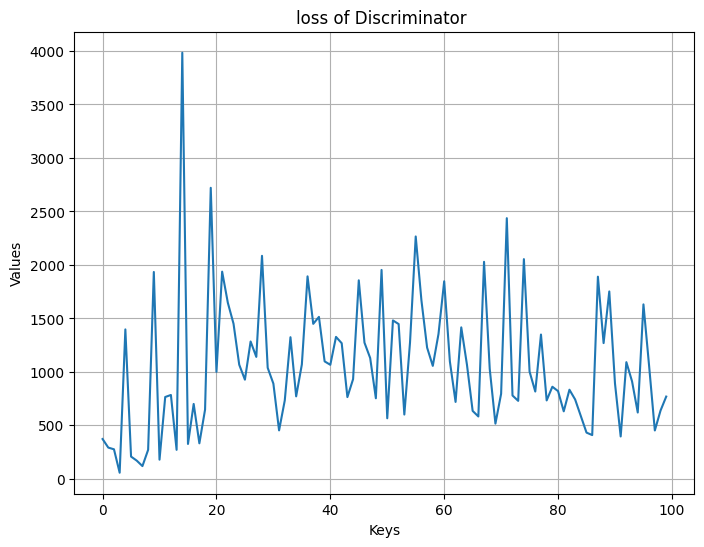

In [75]:
import matplotlib.pyplot as plt

# Extract keys and values
x = list(Dloss.keys())
y = list(Dloss.values())

# Plotting the graph as a line plot
plt.figure(figsize=(8, 6))  # Adjust figure size if needed
plt.plot(x, y, linestyle='-')  # 'marker' sets point style, 'linestyle' sets line style
plt.xlabel('Keys')
plt.ylabel('Values')
plt.title('loss of Discriminator ')
plt.grid(True)  # Add grid lines if desired
plt.show()